In [8]:
%matplotlib inline

from HeaderP import *
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
plt.rcParams.keys()
plt.rc('font', family='serif')
params = {
   'axes.labelsize': 30,
   'axes.linewidth': 1.5,
   'legend.fontsize': 25,
   'legend.frameon': False,
   'lines.linewidth': 2,
   'xtick.direction': 'in',
   'xtick.labelsize': 25,
   'xtick.major.bottom': True,
   'xtick.major.pad': 10,
   'xtick.major.size': 10,
   'xtick.major.width': 1,
   'xtick.minor.bottom': True,
   'xtick.minor.pad': 3.5,
   'xtick.minor.size': 5,
   'xtick.minor.top': True,
   'xtick.minor.visible': True,
   'xtick.minor.width': 1,
   'xtick.top': True,
   'ytick.direction': 'in',
   'ytick.labelsize': 25,
   'ytick.major.pad': 10,
   'ytick.major.size': 10,
   'ytick.major.width': 1,
   'ytick.minor.pad': 3.5,
   'ytick.minor.size': 5,
   'ytick.minor.visible': True,
   'ytick.minor.width': 1,
   'ytick.right': True,
   'figure.figsize': [10,10], # instead of 4.5, 4.5
   'savefig.format': 'eps',
   }
plt.rcParams.update(params)

def fitpoints(x,y):
    z = np.polyfit(x,y,1)
    p = np.poly1d(z)
    return p


from tqdm import trange
import math
def movingMed_time(x,y,x_window,delta_x_window):
    # medians output
    x_med=np.zeros(len(x))
    y_med=np.zeros(len(y))

    # define the boundaries of the windows
    if len(x)==0:
        return x_med,y_med
    window_min=float(min(x))
    window_max=float(window_min+delta_x_window)
    
    # max time
    maxtime=max(x)
    
    # break when time window hits the end
    while window_max<=maxtime+x_window:
        seldf=(x>=window_min) & (x<=window_max) # get points between the window
        
        x_med[seldf]=np.median(x[seldf]) # all values for these indices are subsituded with median time
        y_med[seldf]=np.median(y[seldf]) # all values for these indices are subsituded with median flux
        
        # slide the window
        window_min=window_min+delta_x_window
        window_max=window_max+delta_x_window
    return x_med, y_med

def calcmidval(x_med,y_med,x_val):
    sort_x_med,sort_y_med=zip(*sorted(zip(x_med,y_med)))
    sort_x_med=np.asarray(sort_x_med)
    sort_y_med=np.asarray(sort_y_med)
    if x_val in sort_x_med:
        m=(sort_x_med==x_val)
        #print(sort_y_med[m])
        return sort_y_med[m][0]
    else:
        for i in range(len(sort_x_med)):
            if sort_x_med[i]>x_val:
                if i==0:
                    return sort_y_med[0]
                else:
                    p=fitpoints([sort_x_med[i-1],sort_x_med[i]],[sort_y_med[i-1],sort_y_med[i]])
                    return p(x_val)
            return(sort_y_med[-1])
        
def calc_measure_disp(df,name,method='movingmedian',p=0):
    trytime=100
    agedisp=[]
    
    x,xerr=df['Age'].values,df['Age_err'].values
    y,yerr=df[name].values,df[name+'_ERR'].values
    
    if method=='movingmedian':
        for i in trange(trytime):
            df['newage']=np.array([np.random.normal(x[k], xerr[k],1)[0] for k in range(len(x))])
            df['newabun']=np.array([np.random.normal(y[k], yerr[k],1)[0] for k in range(len(y))])
            df['newmed']=np.array([calcmidval(df['med_age'],df['med_abun'],i) for i in df['newage']])
        
            agedisp.append(np.std(df['newabun']-df['newmed']))
            
    elif method=='linear':
        for i in trange(trytime):
            df['newage']=np.array([np.random.normal(x[k], xerr[k],1)[0] for k in range(len(x))])
            df['newabun']=np.array([np.random.normal(y[k], yerr[k],1)[0] for k in range(len(y))])
            df['newmed']=p(df['newage'])
            
            agedisp.append(np.std(df['newabun']-df['newmed']))
            
            
    return np.std(np.array(agedisp))**2.


def calc_disp(df,name,method='movingmedian',p=0):
    df_dropna=df.dropna(subset=['med_age',name,'med_abun',name+'_ERR'])

    if method=='movingmedian':
        # calcualte total dispersion
        totdisp=np.mean((df_dropna[name]-df_dropna['med_abun'])**2.)
        #print(totdisp)
    
        # calculate measurement dispersion
        meadisp=calc_measure_disp(df,name)
        
    elif method=='linear':
        # calcualte total dispersion
        totdisp=np.std(df_dropna[name]-p(df_dropna['Age']))
        meadisp=calc_measure_disp(df,name,'linear',p)
        
    meadisp=meadisp+np.median(df[name+'_ERR']**2)
    #print(df['Age_err'])
    # calculate int dispersion
    intdisp=np.sqrt(totdisp**2-meadisp)
    print('total',totdisp,'measured',np.sqrt(meadisp),'intr',intdisp)
    return totdisp,intdisp


from scipy.ndimage import gaussian_filter

def tempcheck(df_abun_st_ha,df_abun_st_la,checkname='TEFF'):
    minval=min(min(df_abun_st_ha[checkname]),min(df_abun_st_la[checkname]))
    maxval=max(max(df_abun_st_ha[checkname]),max(df_abun_st_la[checkname]))
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}

    plt.figure(figsize=(22.5,25))
    cm = plt.cm.get_cmap('viridis',5)
    for i in range(1,len(abun_apog)):
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
    
        plt.subplot(5,4,i+1)
        plt.scatter(df_plot_la['Age'],df_plot_la[abun_apog[i]],c=df_plot_la[checkname],vmin=minval,vmax=maxval)
        #plt.scatter(df_plot_ha['Age'],df_plot_ha[abun_apog[i]],s=1,c=df_plot_ha[checkname],vmin=minval,vmax=maxval)
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
    
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,1)
    plt.scatter(df_plot_la['Age'],df_plot_la['M_H'],c=df_plot_la[checkname],vmin=minval,vmax=maxval,
            alpha=0.5,label='low-$\\alpha$')
    """
    plt.scatter(df_plot_ha['Age'],df_plot_ha['M_H'],c=df_plot_ha[checkname],vmin=minval,vmax=maxval,
            s=1,alpha=0.5,label='high-$\\alpha$')
    """
    
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    plt.legend()
 
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,20)
    plt.scatter(df_plot_la['Age'],df_plot_la['C_FE']-df_plot_la['N_FE'],
             c=df_plot_la[checkname],alpha=0.5,vmin=minval,vmax=maxval,label='low-$\\alpha$')
    """
    plt.scatter(df_plot_ha['Age'],df_plot_ha['C_FE']-df_plot_ha['N_FE'],s=1,
             c=df_plot_ha[checkname],alpha=0.5,vmin=minval,vmax=maxval,label='high-$\\alpha$')
    """
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    plt.legend()


    plt.tight_layout()


    
def plotraw(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}
    
    lim=[-0.5,0.5]
    limx=[0,15]
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['Age'],df_plot_la[abun_apog[i]],yerr=df_plot_la[abun_apog[i]+'_ERR'],fmt='bo',alpha=0.5,label='low-$\\alpha$')
        plt.errorbar(df_plot_ha['Age'],df_plot_ha[abun_apog[i]],yerr=df_plot_ha[abun_apog[i]+'_ERR'],fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
        plt.ylim(lim)
        plt.xlim(limx)
        plt.legend()
    
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['Age'],df_plot_la['M_H'],fmt='bo',alpha=0.5,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['M_H'],fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    plt.legend()
    plt.ylim(lim)
    plt.xlim(limx)
 
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['Age'],df_plot_la['C_FE']-df_plot_la['N_FE'],
             fmt='bo',alpha=0.5,label='low-$\\alpha$')
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['C_FE']-df_plot_ha['N_FE'],
             fmt='ro',alpha=0.5,label='high-$\\alpha$')
    
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    plt.legend()
    plt.ylim(lim)
    plt.xlim(limx)


    plt.tight_layout()
    

def plotagedis(df_abun_st_ha,df_abun_st_la,agebin,start,end):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}
    
    size=int(np.ceil((end-start)/agebin))
    age_binned=[(2*j+1)*agebin/2+start for j in range(size)]

    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<10]
        df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
        df_plot_ha=df_plot_ha.reset_index(drop=True)

        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        df_plot_la=df_plot_la.loc[df_plot_la['Age']<10]
        df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
        df_plot_la=df_plot_la.reset_index(drop=True)


        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])



        df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                    df_plot_la[abun_apog[i]].values,
                                                                    agewindow,slidwindow)
        df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                    df_plot_ha[abun_apog[i]].values,
                                                                    agewindow,slidwindow)

        df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
        df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

        df_plot_la_new=df_plot_la.dropna(subset=['med_age','med_abun']).reset_index(drop=True)
        df_plot_ha_new=df_plot_ha.dropna(subset=['med_age','med_abun']).reset_index(drop=True)


        plt.subplot(5,4,i+1)


        if len(df_plot_la['Age'])!=0:   
            print(abun_apog[i])

            dispersions_la=[]
            dispersions_ha=[]
            dispersions_la_err=[]
            dispersions_ha_err=[]
            for j in range(size):
                agemin=j*agebin+start
                agemax=(j+1)*agebin+start

                new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
                new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

                new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
                new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


                tot_la,disp_la=calc_disp(new_df_inbin_la,abun_apog[i])
                tot_ha,disp_ha=calc_disp(new_df_inbin_ha,abun_apog[i])

                dispersions_la.append(disp_la)
                dispersions_ha.append(disp_ha)
                
                if len(new_df_inbin_la)==0:
                    range_la=0
                else:
                    range_la=max(new_df_inbin_la[abun_apog[i]])-min(new_df_inbin_la[abun_apog[i]])
                if len(new_df_inbin_ha)==0:
                    range_ha=0
                else:
                    range_ha=max(new_df_inbin_ha[abun_apog[i]])-min(new_df_inbin_ha[abun_apog[i]])
                
                dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
                dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))

            plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
            plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

        plt.ylabel(abund[abun_apog[i]]+'Fe] dispersion')
        plt.xlabel('Age bin center [Gyr]')



        #plt.legend()

    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)

    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])

    df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['M_H'].values,
                                                                agewindow,slidwindow)
    df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['M_H'].values,
                                                                agewindow,slidwindow)

    df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
    df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

    plt.subplot(5,4,1)
    dispersions_la=[]
    dispersions_ha=[]
    dispersions_la_err=[]
    dispersions_ha_err=[]
    clear_output(wait = True)
    print('FE_H')
    for j in range(size):
        agemin=j*agebin+start
        agemax=(j+1)*agebin+start

        new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
        new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

        new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
        new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


        tot_la,disp_la=calc_disp(new_df_inbin_la,'M_H')
        tot_ha,disp_ha=calc_disp(new_df_inbin_ha,'M_H')

        if len(new_df_inbin_la)==0:
            range_la=0
        else:
            range_la=max(new_df_inbin_la['M_H'])-min(new_df_inbin_la['M_H'])
        if len(new_df_inbin_ha)==0:
            range_ha=0
        else:
            range_ha=max(new_df_inbin_ha['M_H'])-min(new_df_inbin_ha['M_H'])
                    
        dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
        dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))
 
        dispersions_la.append(disp_la)
        dispersions_ha.append(disp_ha)

    plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
    plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

    plt.ylabel('Fe dispersion')
    plt.xlabel('Age bin center [Gyr]')
    #plt.legend()

    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<10]
    df_plot_ha=df_plot_ha.reset_index(drop=True)

    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<10]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    

    df_plot_la['med_age'],df_plot_la['med_abun']=movingMed_time(df_plot_la['Age'].values,
                                                                df_plot_la['C_N'].values,
                                                                agewindow,slidwindow)
    df_plot_ha['med_age'],df_plot_ha['med_abun']=movingMed_time(df_plot_ha['Age'].values,
                                                                df_plot_ha['C_N'].values,
                                                                agewindow,slidwindow)

    df_plot_la['med_abun']=gaussian_filter(df_plot_la['med_abun'], sigma=10)
    df_plot_ha['med_abun']=gaussian_filter(df_plot_ha['med_abun'], sigma=10)

    plt.subplot(5,4,20)
    dispersions_la=[]
    dispersions_ha=[]
    dispersions_la_err=[]
    dispersions_ha_err=[]
    clear_output(wait = True)
    print('C_N')
    for j in trange(size):
        agemin=j*agebin+start
        agemax=(j+1)*agebin+start

        new_df_inbin_la=df_plot_la.loc[df_plot_la['Age']>agemin]
        new_df_inbin_la=new_df_inbin_la.loc[new_df_inbin_la['Age']<agemax]

        new_df_inbin_ha=df_plot_ha.loc[df_plot_ha['Age']>agemin]
        new_df_inbin_ha=new_df_inbin_ha.loc[new_df_inbin_ha['Age']<agemax]


        tot_la,disp_la=calc_disp(new_df_inbin_la,'C_N')
        tot_ha,disp_ha=calc_disp(new_df_inbin_ha,'C_N')

        if len(new_df_inbin_la)==0:
            range_la=0
        else:
            range_la=max(new_df_inbin_la['C_N'])-min(new_df_inbin_la['C_N'])
        if len(new_df_inbin_ha)==0:
            range_ha=0
        else:
            range_ha=max(new_df_inbin_ha['C_N'])-min(new_df_inbin_ha['C_N'])
            
        dispersions_la_err.append(range_la/np.sqrt(len(new_df_inbin_la)))
        dispersions_ha_err.append(range_ha/np.sqrt(len(new_df_inbin_ha)))
        
        dispersions_la.append(disp_la)
        dispersions_ha.append(disp_ha)

    plt.errorbar(age_binned,dispersions_la,yerr=dispersions_la_err,
                         fmt='b-o',label='low-$\\alpha$')
    plt.errorbar(age_binned,dispersions_ha,yerr=dispersions_ha_err,
                         fmt='r-o',label='high-$\\alpha$')

    plt.ylabel('[C/N] dispersion')
    plt.xlabel('Age bin center [Gyr]')
    #plt.legend()

    plt.tight_layout()

/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:18: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:16: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping, namedtuple, defaultdict, Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module 

# For sesmic stars

## Get high/low-$\alpha$ disk

Ages from https://ui.adsabs.harvard.edu/abs/2019yCat..22390032P/abstract

In [9]:
hdulist = fits.open('asu.fit')


In [10]:
df1 = pd.DataFrame(hdulist[1].data, dtype="float64")
df2 = pd.DataFrame(hdulist[2].data, dtype="float64")

In [11]:
df=pd.merge(df1,df2,left_on='KIC',right_on='KIC',how='inner')

In [12]:
df_apo=pd.read_pickle('/Users/lucy/Desktop/ASTR/Columbia/GalacticArch/APOGEE.pkl')
df_apo['2MASS']=[i[2:] for i in df_apo['APOGEE_ID']]
df=pd.merge(df,df_apo,left_on='_2MASS',right_on='2MASS',how='inner')

In [13]:
def convd2R(x):
    return x/180*np.pi

df['X'] = df.GAIA_R_EST * np.cos(convd2R(df.GLAT)) * np.cos(convd2R(df.GLON)) / 1000.
df['Y'] = -df.GAIA_R_EST * np.sin(convd2R(df.GLON)) * np.cos(convd2R(df.GLAT))/ 1000.
df['z'] = df.GAIA_R_EST * np.sin(convd2R(df.GLAT))/ 1000.
df['R'] = np.sqrt(np.power(df.X - 8.2,2.) + np.power(df.Y,2.))


In [14]:
df['Age']=np.power(10,df['LogAge'])/1e3
df['Age_err']=(np.power(10,df['LogAge']+df['E_LogAge'])/1e3-np.power(10,df['LogAge']+df['e_logage_lc'])/1e3)/2

In [15]:
#df.to_pickle('ASstars.pkl')

In [16]:
np.median(df['Age_err'].dropna())


0.8777411473258232

In [17]:
print(len(df))
df=df.loc[df['Age_err']/df['Age']<0.3]
df=df.loc[df['M_H_ERR']<0.03].reset_index(drop=True)
print(len(df))
df=df.loc[df['SNR']>150].reset_index(drop=True)
print(len(df))

6727
5505
3917


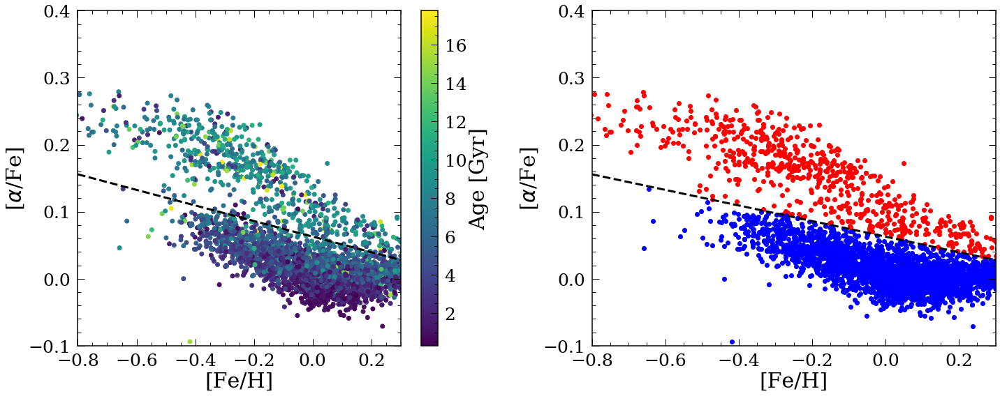

In [18]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['FeH'],df['AFe'],c=df['Age'])
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['AFe']-p(df['FeH'])>=0]
low_alpha=df[df['AFe']-p(df['FeH'])<0]

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['FeH'],high_alpha['AFe'],c='r')
plt.scatter(low_alpha['FeH'],low_alpha['AFe'],c='b')
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

## Select temperature range and plot individual element abundance trend

In [19]:
#rangeTeff=25
#tempcut=4674

Ferange=0.05

df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<Ferange]
df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<Ferange]

df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['Age'])<10]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['Age'])<10]

#print(len(df_abun_st_ha))
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF']-tempcut)<rangeTeff]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF']-tempcut)<rangeTeff]
#print(len(df_abun_st_ha))


print(len(df_abun_st_la),len(df_abun_st_ha))

642 53


In [20]:
#df_abun_st_ha[['R','z','Teff']].hist()


check if there is temp gradient in the trends

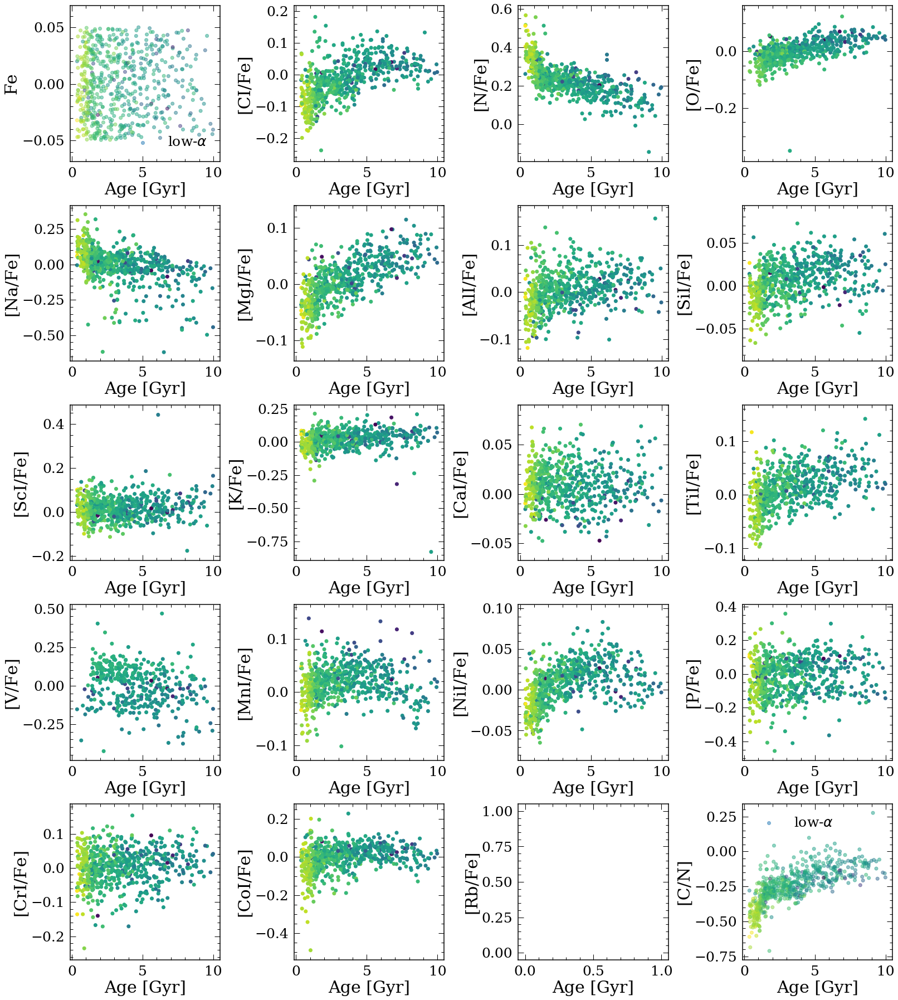

In [26]:
tempcheck(df_abun_st_ha,df_abun_st_la,'TEFF')

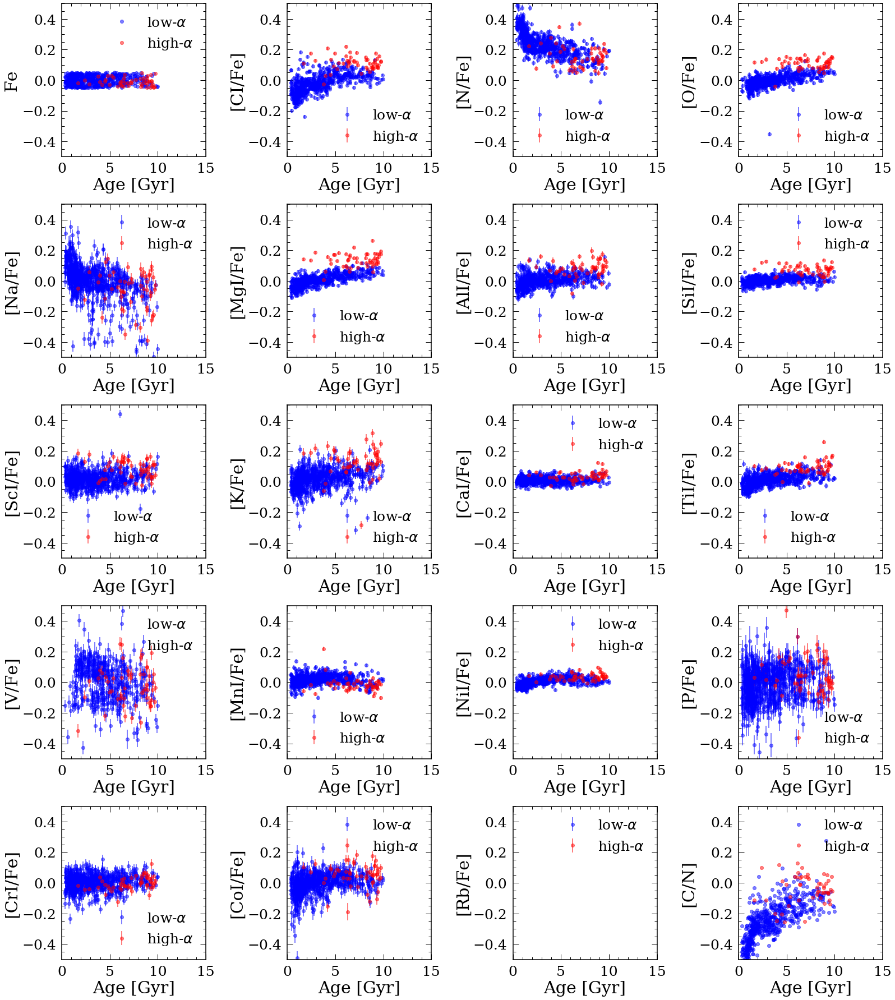

In [29]:
plotraw(df_abun_st_ha,df_abun_st_la)

100%|██████████| 100/100 [00:00<00:00, 371.46it/s]


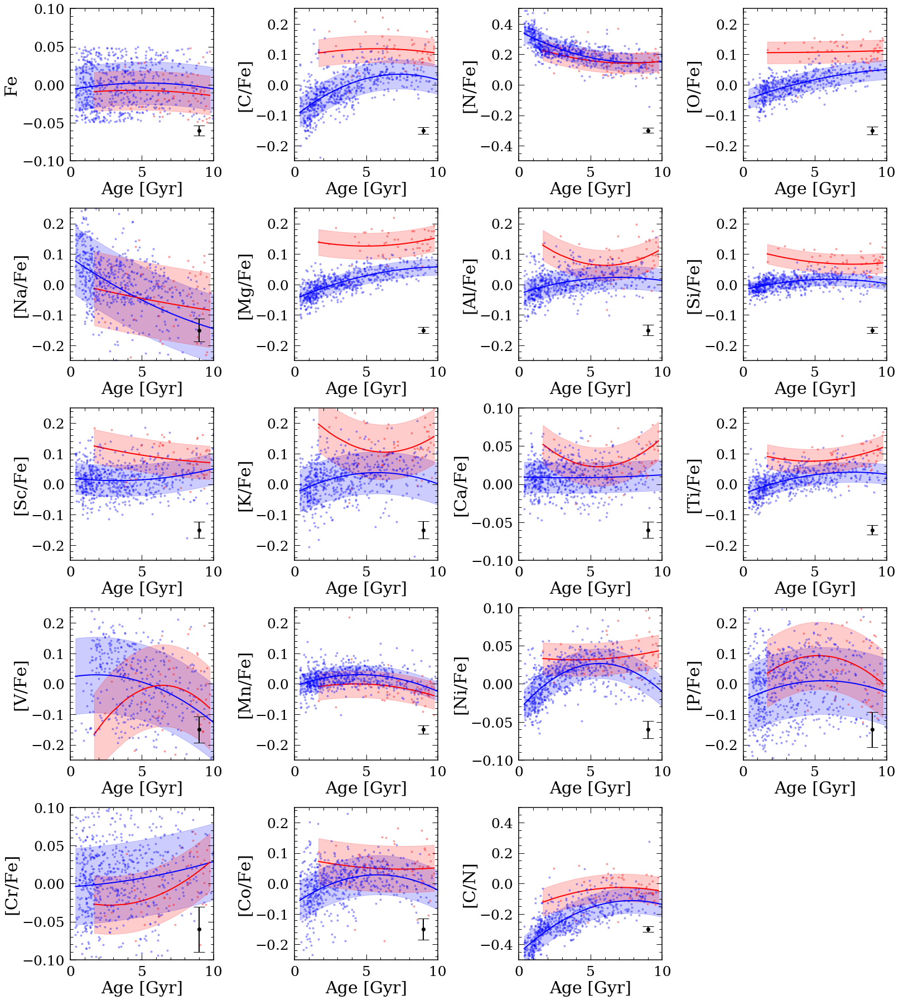

In [21]:
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance','linear',2)


In [22]:
Abunname

['[C/Fe]',
 '[N/Fe]',
 '[O/Fe]',
 '[Na/Fe]',
 '[Mg/Fe]',
 '[Al/Fe]',
 '[Si/Fe]',
 '[Sc/Fe]',
 '[K/Fe]',
 '[Ca/Fe]',
 '[Ti/Fe]',
 '[V/Fe]',
 '[Mn/Fe]',
 '[Ni/Fe]',
 '[P/Fe]',
 '[Cr/Fe]',
 '[Co/Fe]',
 'Fe',
 '[C/N]']

In [23]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
Abunname[-1]='C/N'
df_disp=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_astro','ha_dis_astro'])
lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis=zip(*sorted(zip(lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis)))
df_disp

,Abund,la_dis_astro,ha_dis_astro
0,C,0.04761980972628173,0.04443719540113884
1,N,0.059048856931277045,0.0671889677193397
2,O,0.03205555576941135,0.03590770197117728
3,Na,0.11124790871760286,0.12152227661338773
4,Mg,0.026475810689559526,0.042710812182841486
5,Al,0.03763542095492403,0.049700768827242524
6,Si,0.020087312383594992,0.03198190566337223
7,Sc,0.051109780633064816,0.05485597879547499
8,K,0.06891900134281731,0.08995127458325361
9,Ca,0.02002360234710912,0.025202453341524822


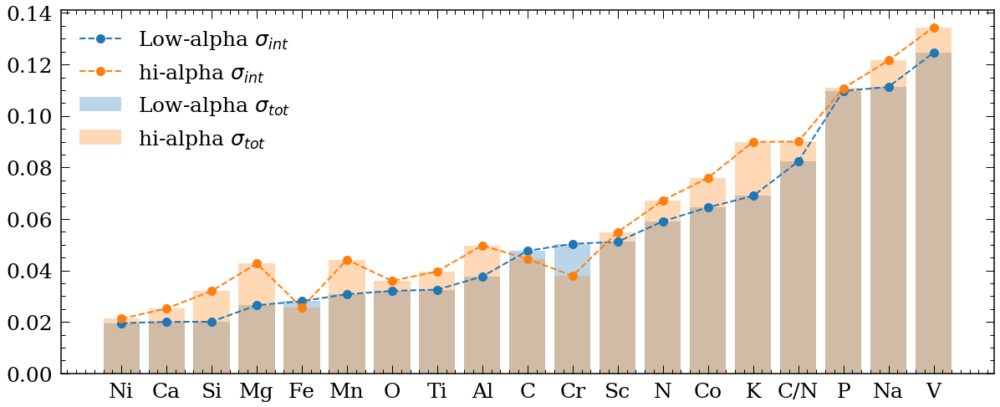

In [33]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
#plt.savefig('dispersion_astro.png')

## Calculate dispersion in age bin

100%|██████████| 100/100 [00:00<00:00, 840.93it/s][A

100%|██████████| 100/100 [00:00<00:00, 1103.99it/s]

C_N



/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:698: RuntimeWarning: invalid value encountered in double_scalars
100%|██████████| 100/100 [00:00<00:00, 671.48it/s][A

100%|██████████| 100/100 [00:00<00:00, 657.09it/s][A

100%|██████████| 100/100 [00:00<00:00, 509.16it/s][A

100%|██████████| 100/100 [00:00<00:00, 404.30it/s][A

100%|██████████| 100/100 [00:00<00:00, 368.30it/s][A

100%|██████████| 100/100 [00:00<00:00, 395.39it/s][A

100%|██████████| 100/100 [00:00<00:00, 494.18it/s][A

100%|██████████| 100/100 [00:00<00:00, 668.57it/s][A

100%|██████████| 100/100 [00:00<00:00, 1024.36it/s]

100%|██████████| 10/10 [00:03<00:00,  3.05it/s]


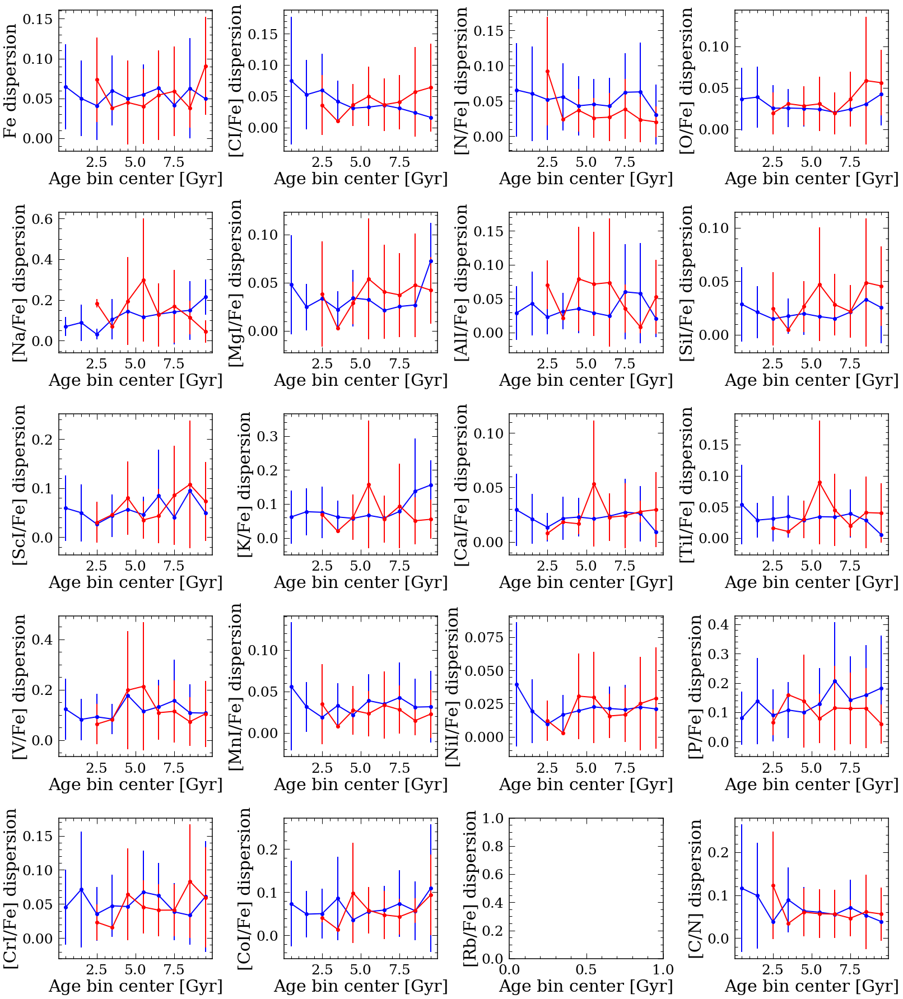

In [30]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# For red clump stars from the cannon

## Get high/low-$\alpha$ disk

In [24]:
abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','ALPHA_M']
print(len(abun_apog))

19


In [25]:
df_CM=pd.read_pickle('CannonDR16_cut.pkl')
for i in abun_apog:
    df_CM=df_CM.loc[abs(df_CM[i])<5]
df_CM=df_CM.reset_index(drop=True)
print('before cutting:',len(df_CM))
# After cutting
#df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
#df=df.loc[df['TEFF']<5200]
#print('after cutting:',len(df))

# get red clump stars
df=df_CM.loc[df_CM['DP']>230]



before cutting: 64399


In [26]:
print('rc stars',len(df))

rc stars 22074


In [27]:
print(len(df))
df=df.loc[df['SNR']>150].reset_index(drop=True)
#df=df.loc[df['Age_err']/df['Age']<0.5].reset_index(drop=True)
df=df.loc[df['M_H_ERR']<0.03].reset_index(drop=True)
print(len(df))

22074
13225


64399 13225


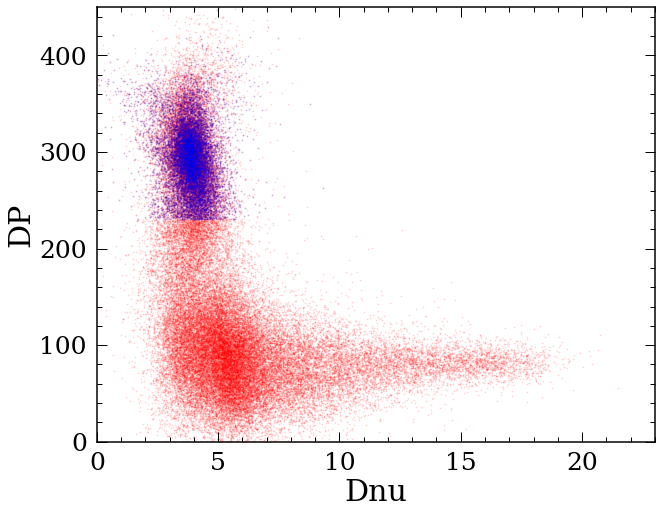

In [28]:
plt.figure(figsize=(10,8))
plt.scatter(df_CM['Dnu'],df_CM['DP'],c='r',alpha=0.1,s=1,label='All')
plt.scatter(df['Dnu'],df['DP'],c='b',alpha=0.1,s=1,label='Red Clumps')
plt.ylim([0,450])
plt.xlim([0,23])
plt.xlabel('Dnu')
plt.ylabel('DP')
print(len(df_CM),len(df))



In [29]:
df

,ID,[Fe/H],T_{eff},Log(g),[Mg/Fe],DP,Dnu,LogAge,[Fe/H]_err,T_{eff}_err,...,X,Y,z,R,Age,Age_err,LogAge_upp,LogAge_low,hi_low,hi_low_line
0,2M19441366+4122541,0.120943,4815.302225,2.595823,-0.049038,304.012215,5.183211,3.406383,0.011284,0.024198,...,0.401367,-1.530668,0.238412,7.947428,2.549075,1.286976,4142.513262,1568.560403,0,False
1,2M19450118+4135207,0.008879,4572.659167,2.410126,0.121836,285.456890,3.928058,3.702256,0.011802,0.020920,...,0.523980,-2.035301,0.315525,7.941268,5.037976,2.525732,8161.379272,3109.915754,0,True
2,2M19450323+4055419,0.200213,4708.835329,2.519983,-0.018351,287.245422,3.719000,3.125394,0.009936,0.021391,...,0.369017,-1.375425,0.205534,7.950854,1.334731,0.665233,2156.556158,826.089267,0,False
3,2M19450489+4109386,-0.073075,4834.349750,2.512783,-0.007077,322.074661,4.032540,3.376476,0.012416,0.026403,...,0.221736,-0.838621,0.126866,8.022218,2.379449,1.215330,3887.183794,1456.524223,0,False
4,2M19451972+4110314,0.241882,4678.026266,2.384397,0.023979,337.018767,3.127945,4.168429,0.009303,0.019255,...,0.374501,-1.419973,0.213899,7.953286,14.737667,7.150681,23531.495113,9230.133555,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13220,2M08201877+2748538,-0.139162,4849.750848,2.444937,0.031773,267.956345,4.284610,3.550596,0.012958,0.027946,...,-0.657792,0.177961,0.404488,8.859580,3.553004,1.831352,5828.562382,2165.857496,0,False
13221,2M08202257+2659377,-0.156872,4829.071035,2.359161,0.076337,315.531265,3.864868,3.495566,0.012589,0.025038,...,-0.765221,0.220235,0.468440,8.967926,3.130156,1.617008,5140.158170,1906.142416,0,False
13222,2M08203084+2809198,-0.167575,4640.441607,2.358262,0.147146,317.293223,3.444234,3.786975,0.012749,0.022483,...,-1.526808,0.402642,0.942472,9.735138,6.123154,3.088572,9946.581077,3769.437232,0,True
13223,2M13262008+3158455,-0.185766,4791.941486,2.514160,0.230639,241.775080,4.315295,3.271121,0.013091,0.031238,...,0.120013,-0.291423,1.989496,8.085241,1.866899,0.941531,3032.413789,1149.352675,1,True


10239 2986


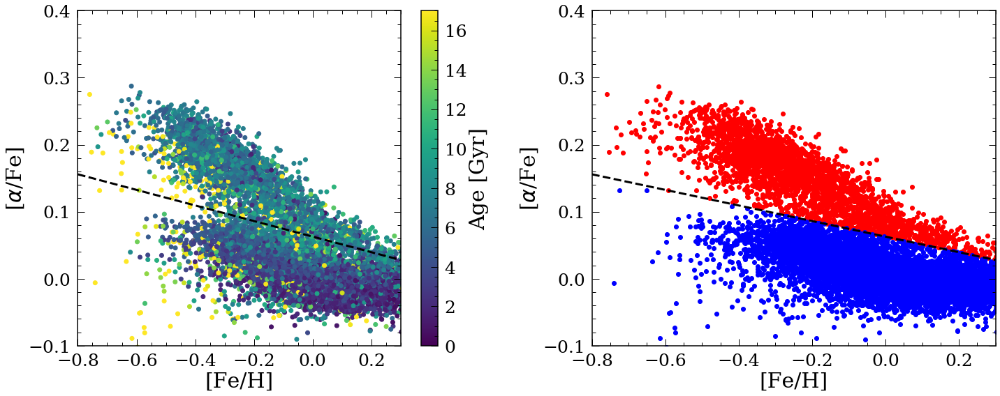

In [30]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['ALPHA_M'],c=df['Age'],vmin=0,vmax=17)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4]) 
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['ALPHA_M']-p(df['M_H'])>=0]
low_alpha=df[df['ALPHA_M']-p(df['M_H'])<0]
print(len(low_alpha),len(high_alpha))

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['ALPHA_M'],c='r')
plt.scatter(low_alpha['M_H'],low_alpha['ALPHA_M'],c='b')
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

4617.60498046875
(53, 270)


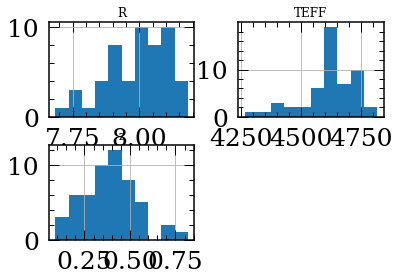

In [31]:
df_abun_st_ha[['R','z','TEFF']].hist()
print(np.mean(df_abun_st_ha['TEFF']))
print(np.shape(df_abun_st_ha))

## Select temperature range and plot individual element abundance trend

In [32]:
#rangeTeff=25
#tempcut=4674

df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<0.05]
df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<0.05]

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['Age'])<10]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['Age'])<10]

"""
#print(len(df_abun_st_ha))
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF'])<4650]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF'])<4650]

df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF'])>4600]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF'])>4600]
"""
print(len(df_abun_st_ha),len(df_abun_st_la))



301 1933


In [33]:
#df_abun_st_ha=high_alpha
#df_abun_st_la=low_alpha
#print(len(df_abun_st_ha),len(df_abun_st_la))

In [34]:
print(len(df_abun_st_ha),len(df_abun_st_la))

301 1933


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x160654e80>,
      dtype=object)

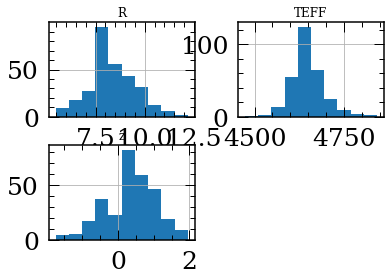

In [35]:
df_abun_st_ha[['R','z','TEFF']].hist()



255 1819


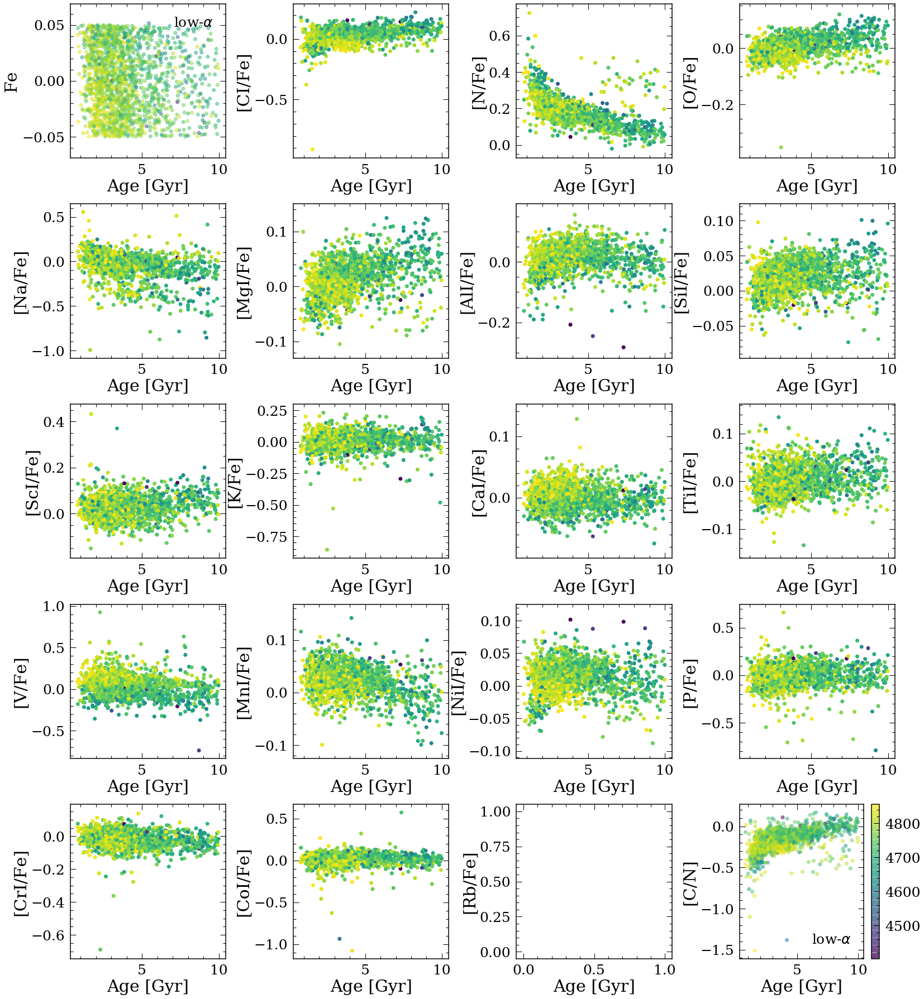

In [146]:
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['R']-7.5)<0.5]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['R']-7.5)<0.5]
df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<0.05]
df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<0.05]
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['Age'])<10]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['Age'])<10]
print(len(df_abun_st_ha),len(df_abun_st_la))
tempcheck(df_abun_st_ha,df_abun_st_la,'TEFF')
plt.colorbar()

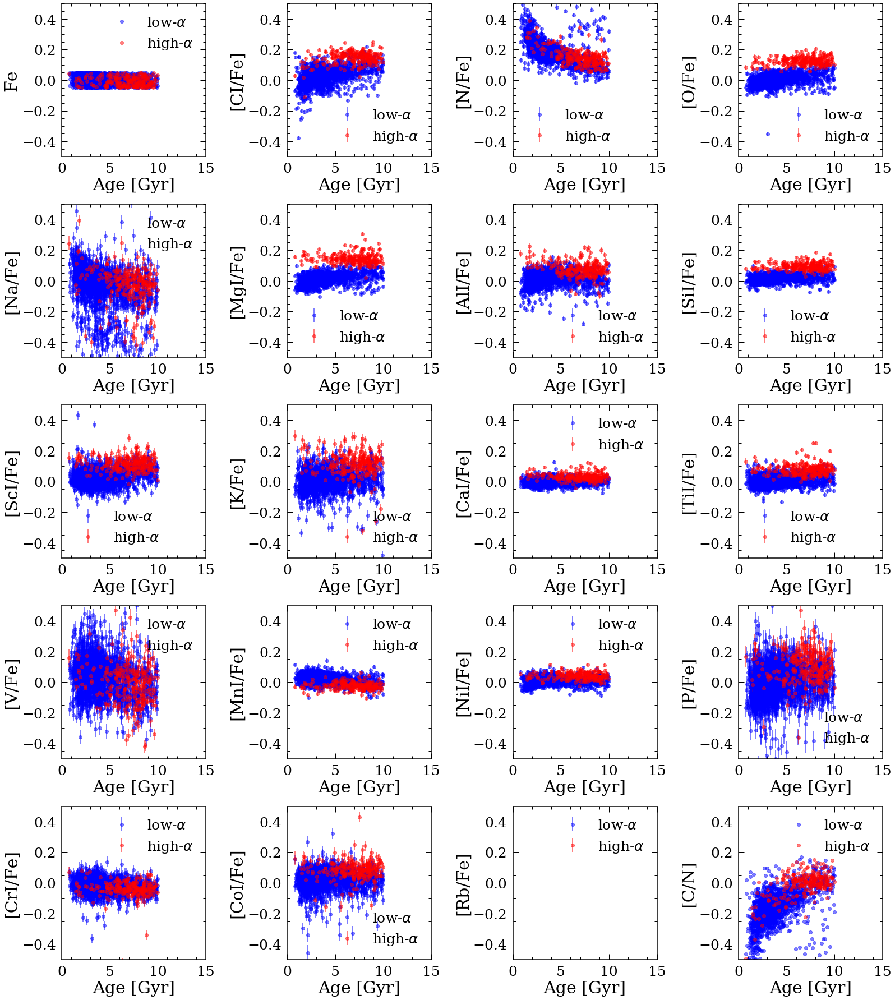

In [122]:
plotraw(df_abun_st_ha,df_abun_st_la)


100%|██████████| 100/100 [00:00<00:00, 143.91it/s]


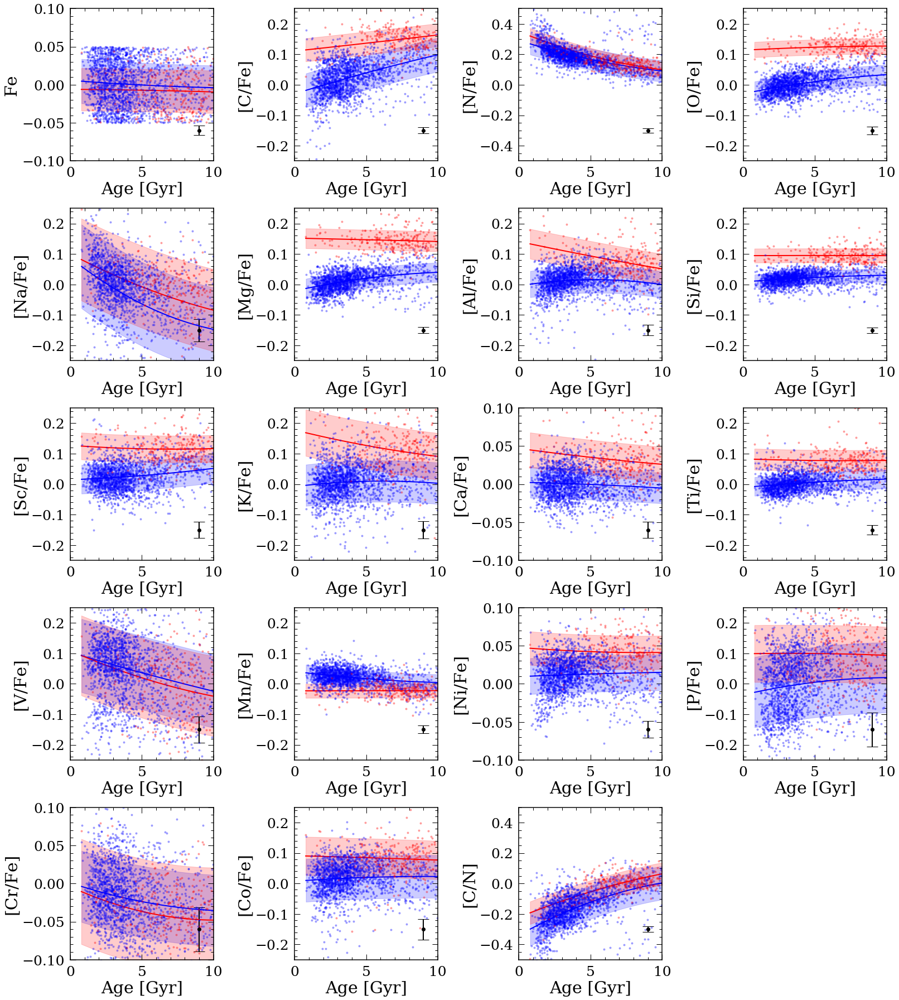

In [36]:
#hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon_rc')
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon_rc','linear',2)


In [37]:
Abunname

['[C/Fe]',
 '[N/Fe]',
 '[O/Fe]',
 '[Na/Fe]',
 '[Mg/Fe]',
 '[Al/Fe]',
 '[Si/Fe]',
 '[Sc/Fe]',
 '[K/Fe]',
 '[Ca/Fe]',
 '[Ti/Fe]',
 '[V/Fe]',
 '[Mn/Fe]',
 '[Ni/Fe]',
 '[P/Fe]',
 '[Cr/Fe]',
 '[Co/Fe]',
 'Fe',
 '[C/N]']

In [38]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
Abunname[-1]='C/N'

df_disp_rc=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_rc','ha_dis_rc'])

df_disp_rc

,Abund,la_dis_rc,ha_dis_rc
0,C,0.055356525227238836,0.03793984294829292
1,N,0.06987410576967307,0.05097099887966888
2,O,0.03267171425924065,0.025187654045629154
3,Na,0.13744448413291485,0.13451227065198693
4,Mg,0.031648783557384964,0.0326273924711862
5,Al,0.04300936191044131,0.048893582525441515
6,Si,0.02122095167579488,0.023073511655121955
7,Sc,0.04722231694639768,0.04415146827773869
8,K,0.06783822464088231,0.07633070019350677
9,Ca,0.020100848714184927,0.02282919100792869


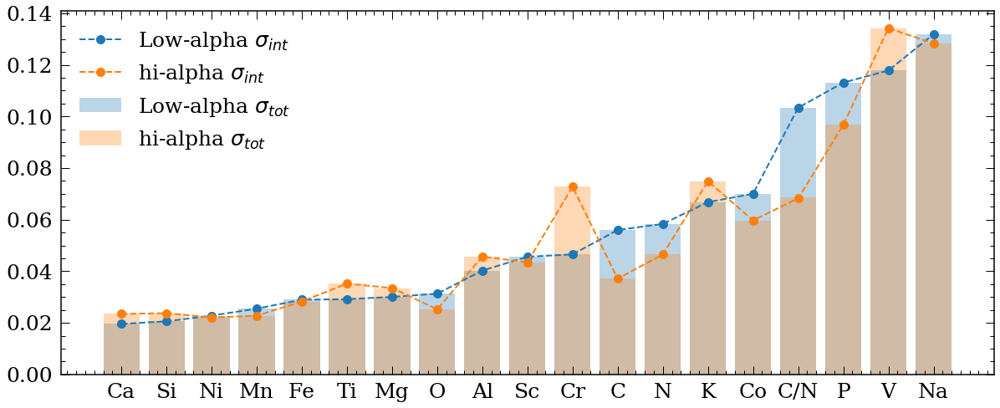

In [139]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
plt.savefig('dispersion_cannon_rc.png')

100%|██████████| 100/100 [00:00<00:00, 893.01it/s][A

  0%|          | 0/100 [00:00<?, ?it/s]

C_N



100%|██████████| 100/100 [00:00<00:00, 920.42it/s][A
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:784: RuntimeWarning: invalid value encountered in double_scalars
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:785: RuntimeWarning: invalid value encountered in double_scalars
100%|██████████| 100/100 [00:00<00:00, 260.60it/s][A

100%|██████████| 100/100 [00:00<00:00, 106.41it/s]

100%|██████████| 100/100 [00:01<00:00, 85.68it/s][A

100%|██████████| 100/100 [00:01<00:00, 86.67it/s]

100%|██████████| 100/100 [00:00<00:00, 120.07it/s]

100%|██████████| 100/100 [00:00<00:00, 150.29it/s][A

100%|██████████| 100/100 [00:00<00:00, 199.96it/s][A

100%|██████████| 100/100 [00:00<00:00, 260.45it/s][A

100%|██████████| 100/100 [00:00<00:00, 261.71it/s][A

100%|██████████| 10/10 [00:09<00:00,  1.04it/s]


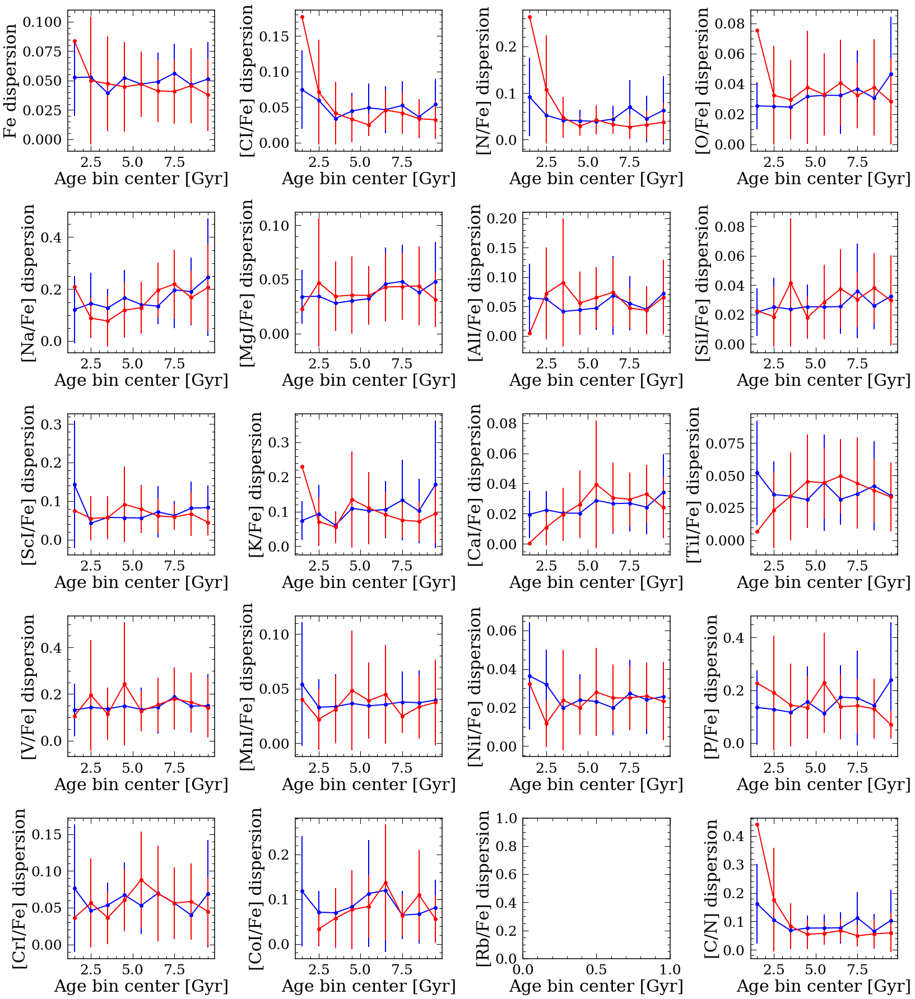

In [32]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# All stars from the cannon

before cutting: 64399
after cutting: 64308


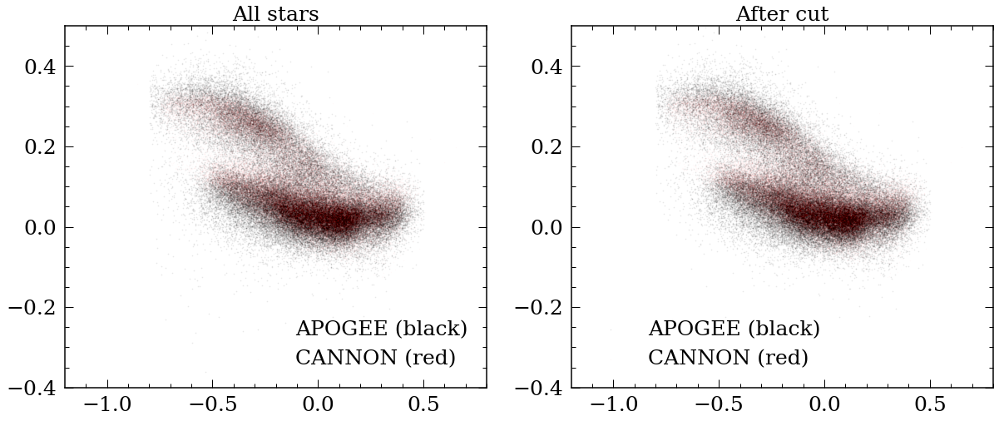

In [39]:
df=pd.read_pickle('CannonDR16_cut.pkl')
print('before cutting:',len(df))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('All stars',fontsize=25)
plt.legend()

# After cutting
df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
df=df.loc[df['TEFF']<5200]


plt.subplot(1,2,2)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('After cut',fontsize=25)
plt.legend()

print('after cutting:',len(df))



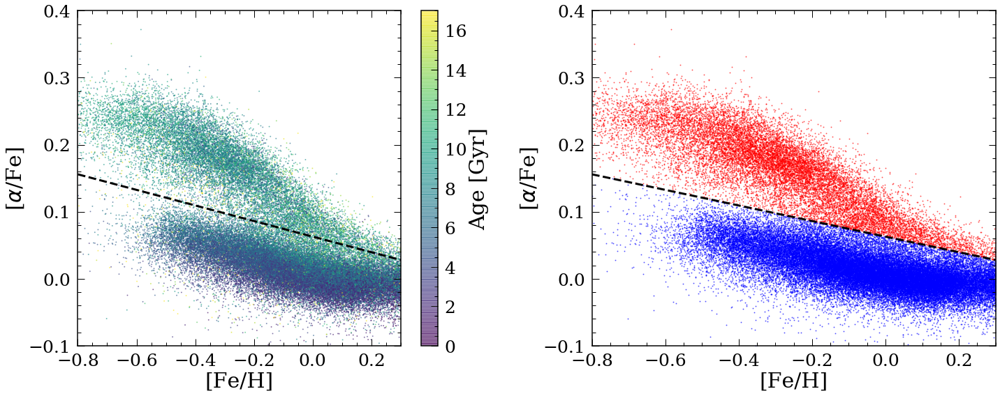

In [40]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['ALPHA_M'],c=df['Age'],s=1,vmin=0,vmax=17,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['ALPHA_M']-p(df['M_H'])>=0]
low_alpha=df[df['ALPHA_M']-p(df['M_H'])<0]

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['ALPHA_M'],c='r',s=1,alpha=0.5)
plt.scatter(low_alpha['M_H'],low_alpha['ALPHA_M'],c='b',s=1,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

In [133]:
df_abun_st_ha=high_alpha.loc[abs(high_alpha['M_H'])<0.05]
#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['GAIA_R_EST']-2000)<1000]


df_abun_st_la=low_alpha.loc[abs(low_alpha['M_H'])<0.05]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['GAIA_R_EST']-2000)<1000]


#df_abun_st_ha['M_H'].hist()

In [134]:
rangeTeff=25
tempcut=4674

rangeR=0.25
Rcut=7.98

rangez=0.5
zcut=0.46

print(len(df_abun_st_ha))
df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['TEFF']-tempcut)<rangeTeff]
df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['TEFF']-tempcut)<rangeTeff]
print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['R']-Rcut)<rangeR]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['R']-Rcut)<rangeR]
#print(len(df_abun_st_ha))

#df_abun_st_ha=df_abun_st_ha.loc[abs(df_abun_st_ha['z']-zcut)<rangez]
#df_abun_st_la=df_abun_st_la.loc[abs(df_abun_st_la['z']-zcut)<rangez]
#print(len(df_abun_st_ha))

1352
291


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x15d47a5f8>,
      dtype=object)

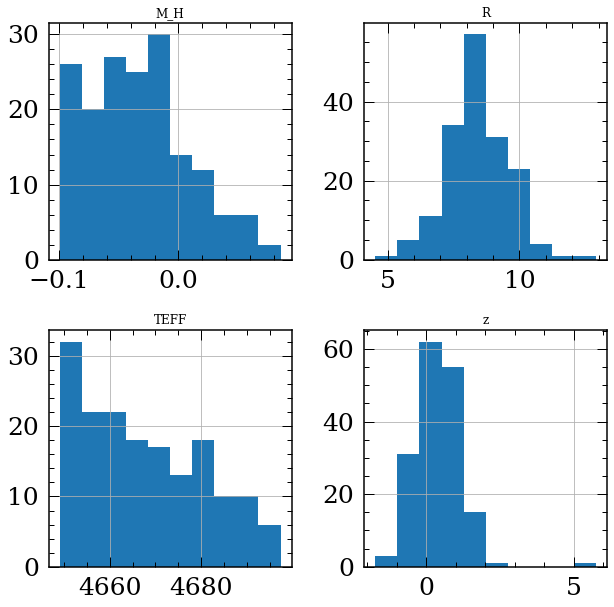

In [130]:
df_abun_st_ha[['R','z','TEFF','M_H']].hist()




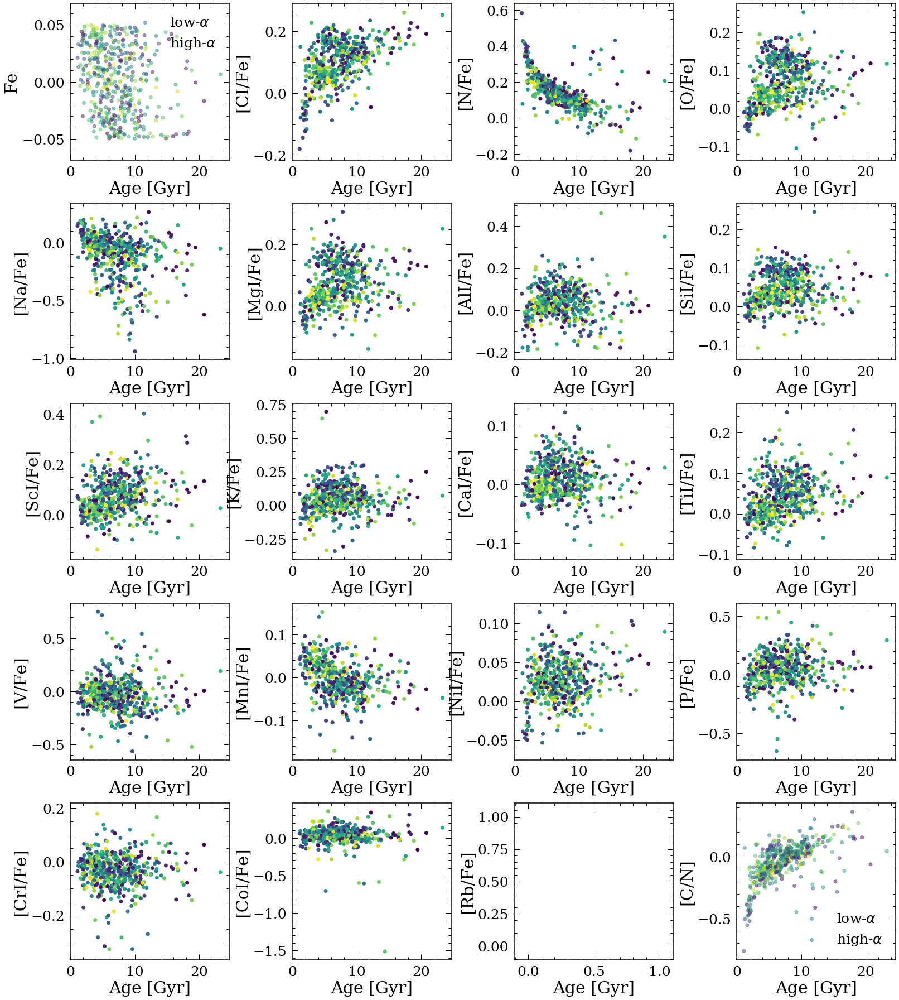

In [497]:
tempcheck(df_abun_st_ha,df_abun_st_la)



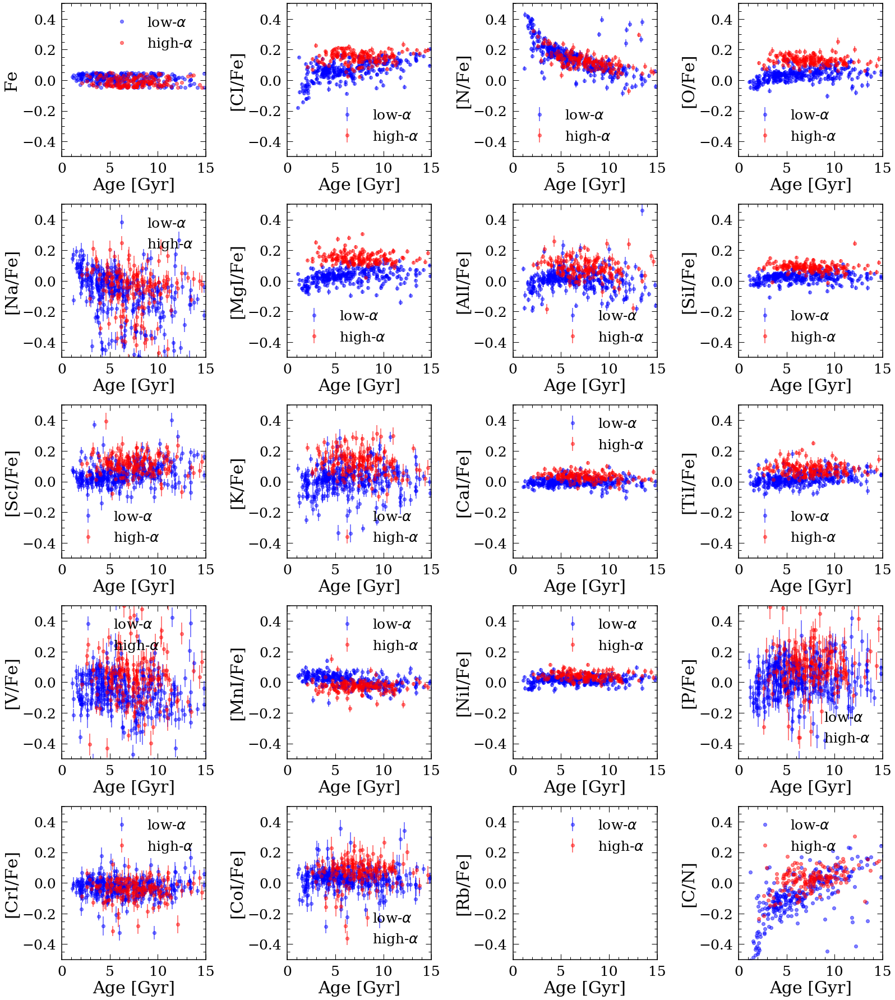

In [498]:
plotraw(df_abun_st_ha,df_abun_st_la)



100%|██████████| 100/100 [00:00<00:00, 143.96it/s]


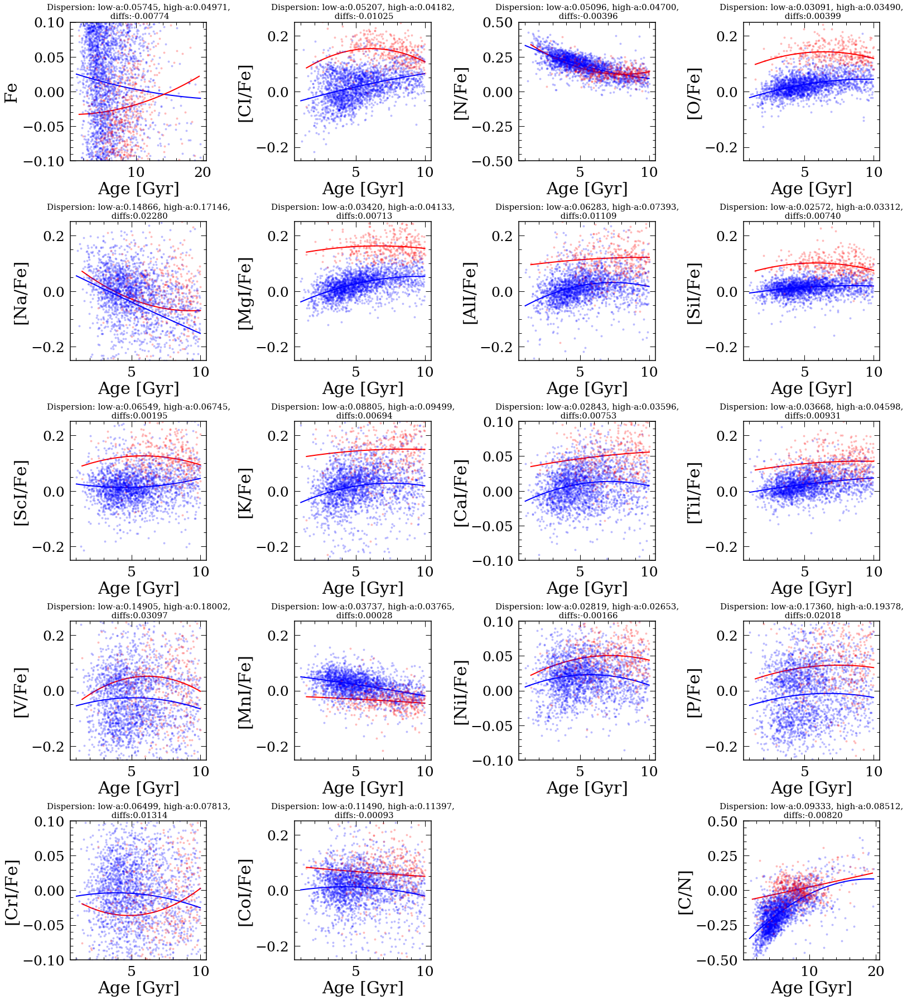

In [40]:
#hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon')
hi_dis, lo_dis, tot_hi_dis, tot_lo_dis, Abunname=plotTrends(df_abun_st_ha,df_abun_st_la,'abundance_cannon','linear',2)




In [41]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]
df_disp_all=pd.DataFrame(np.array((Abunname,lo_dis,hi_dis)).T,columns=['Abund','la_dis_all','ha_dis_all'])


lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis=zip(*sorted(zip(lo_dis,Abunname,hi_dis,tot_lo_dis,tot_hi_dis)))
#tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis=zip(*sorted(zip(tot_lo_dis,lo_dis,Abunname,hi_dis,tot_hi_dis)))

df_abun_st_ha

,ID,[Fe/H],T_{eff},Log(g),[Mg/Fe],DP,Dnu,LogAge,[Fe/H]_err,T_{eff}_err,...,FLAGREAD,X,Y,z,R,Age,Age_err,LogAge_upp,LogAge_low,hi_low
330,2M19580716+4035378,-0.104703,4652.357461,2.329150,0.168776,309.230335,3.460360,3.730962,0.016477,0.028962,...,0,0.728063,-2.906272,0.309769,8.017248,5.382230,2.848762,8938.412146,3240.889088,0
354,2M18494767-2854253,-0.020128,4691.348612,2.391997,0.192156,299.141079,4.713349,3.892998,0.011281,0.019718,...,0,1.730520,-0.200508,-0.383202,6.472587,7.816236,3.891969,12623.576956,4839.638563,0
452,2M08253188+2043157,-0.038757,4696.788846,2.898457,0.196210,50.097455,10.321882,3.989914,0.011635,0.025172,...,0,-0.900539,0.388886,0.556690,9.108844,9.770433,4.820636,15715.583298,6074.311688,0
859,2M20272100+1639046,-0.073698,4689.169419,2.451420,0.203209,279.854092,4.825658,3.697629,0.013977,0.026886,...,0,2.172282,-3.647998,-0.938578,7.045657,4.984590,2.556654,8158.673072,3045.365086,1
953,2M17090915+3221244,-0.082994,4684.608863,2.651930,0.116499,69.741765,6.304746,3.662218,0.011339,0.025786,...,0,0.344292,-0.493041,0.415601,7.871165,4.594280,2.308101,7449.573998,2833.371767,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63547,2M07485213+0905310,-0.073449,4675.005046,2.794164,0.211232,61.566085,8.899555,3.900241,0.011589,0.024666,...,0,-0.775896,0.469835,0.274836,8.988184,7.947697,3.939044,12809.329498,4931.241278,1
63581,2M03545103+2544457,-0.082539,4652.103254,2.709645,0.122326,76.868342,6.372193,3.962600,0.012143,0.026505,...,0,-1.249555,-0.293356,-0.495700,9.454108,9.174864,4.562935,14809.812335,5683.943140,0
63738,2M08181231+1610062,-0.066939,4679.778780,2.313220,0.161707,301.238916,4.111956,3.796390,0.014629,0.024870,...,0,-2.283323,1.185104,1.270881,10.550096,6.257347,3.203797,10233.641126,3826.047036,0
63914,2M00152634+6330516,-0.057803,4612.683194,2.368793,0.078147,297.470131,3.259296,3.829985,0.016831,0.030853,...,0,-2.020823,-3.656038,0.067282,10.855037,6.760590,3.533000,11161.083922,4095.083901,0


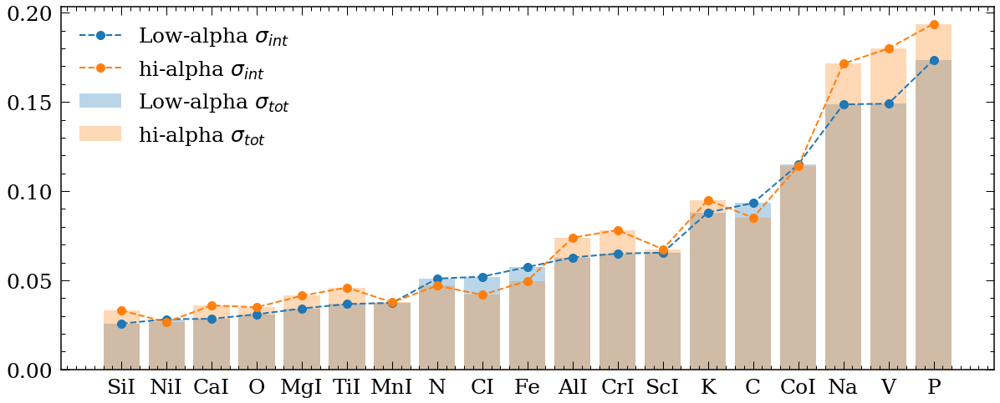

In [42]:
plt.figure(figsize=(20,8))
plt.plot(Abunname,lo_dis,'--o',label='Low-alpha $\sigma_{int}$',markersize=10)
plt.plot(Abunname,hi_dis,'--o',label='hi-alpha $\sigma_{int}$',markersize=10)
plt.bar(Abunname,tot_lo_dis,label='Low-alpha $\sigma_{tot}$',alpha=0.3)
plt.bar(Abunname,tot_hi_dis,label='hi-alpha $\sigma_{tot}$',alpha=0.3)
plt.legend()
plt.savefig('dispersion_cannon.png')

100%|██████████| 100/100 [00:00<00:00, 1139.41it/s]

100%|██████████| 100/100 [00:00<00:00, 1195.47it/s]
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:697: RuntimeWarning: invalid value encountered in double_scalars
/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:698: RuntimeWarning: invalid value encountered in double_scalars
 10%|█         | 1/10 [00:00<00:01,  5.02it/s]

C_N



100%|██████████| 100/100 [00:00<00:00, 256.70it/s][A

100%|██████████| 100/100 [00:02<00:00, 43.01it/s]

100%|██████████| 100/100 [00:12<00:00,  8.30it/s]

100%|██████████| 100/100 [00:16<00:00,  6.25it/s]

100%|██████████| 100/100 [00:08<00:00, 11.13it/s]

 40%|████      | 40/100 [00:02<00:03, 18.68it/s]


100%|██████████| 100/100 [00:05<00:00, 18.95it/s]

100%|██████████| 100/100 [00:02<00:00, 37.50it/s][A

100%|██████████| 100/100 [00:01<00:00, 61.67it/s][A

100%|██████████| 100/100 [00:01<00:00, 73.82it/s]

100%|██████████| 10/10 [00:55<00:00,  5.52s/it]


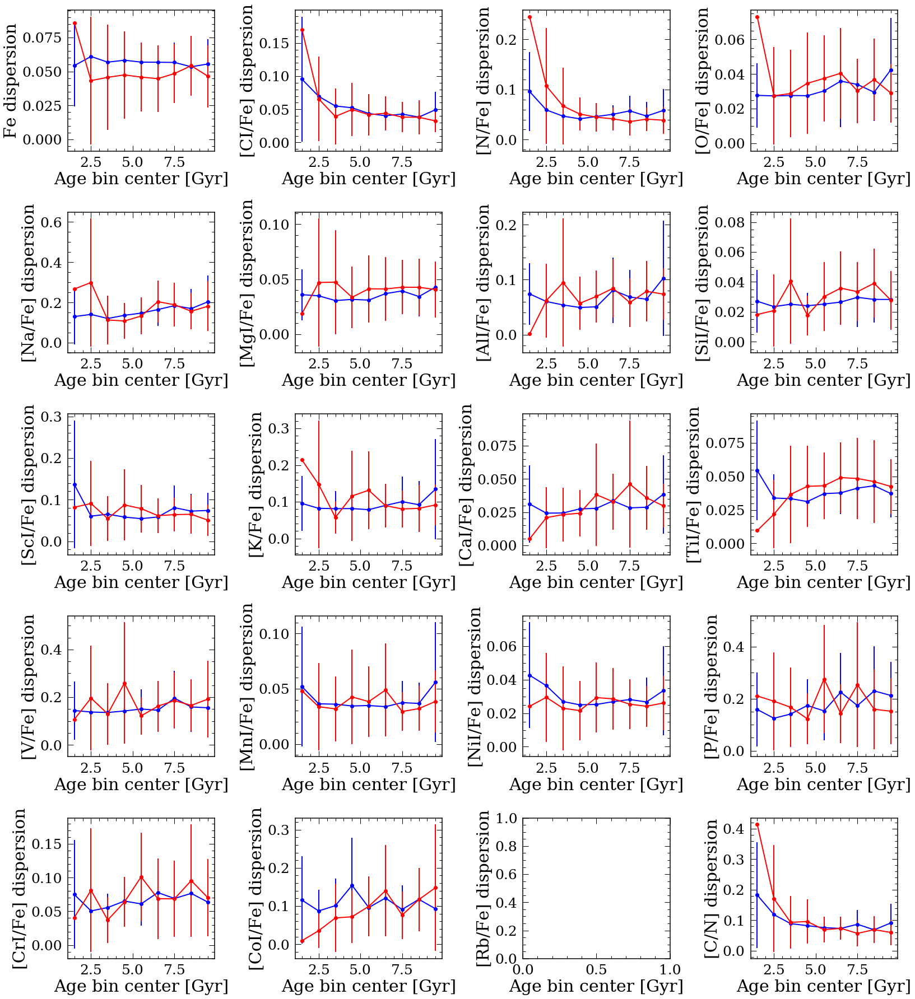

In [60]:
plotagedis(df_abun_st_ha,df_abun_st_la,1,0,10)

# compare all intrinsic dispersion

In [41]:
df_disp_plot=pd.merge(df_disp,df_disp_rc,left_on='Abund',right_on='Abund',how='inner')


In [42]:
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc
0,C,0.04761980972628173,0.04443719540113884,0.055356525227238836,0.03793984294829292
1,N,0.059048856931277045,0.0671889677193397,0.06987410576967307,0.05097099887966888
2,O,0.03205555576941135,0.03590770197117728,0.03267171425924065,0.025187654045629154
3,Na,0.11124790871760286,0.12152227661338773,0.13744448413291485,0.13451227065198693
4,Mg,0.026475810689559526,0.042710812182841486,0.031648783557384964,0.0326273924711862
5,Al,0.03763542095492403,0.049700768827242524,0.04300936191044131,0.048893582525441515
6,Si,0.020087312383594992,0.03198190566337223,0.02122095167579488,0.023073511655121955
7,Sc,0.051109780633064816,0.05485597879547499,0.04722231694639768,0.04415146827773869
8,K,0.06891900134281731,0.08995127458325361,0.06783822464088231,0.07633070019350677
9,Ca,0.02002360234710912,0.025202453341524822,0.020100848714184927,0.02282919100792869


In [43]:
df_disp_plot['la_dis_astro']=np.array(df_disp_plot['la_dis_astro'],dtype=float)
df_disp_plot['ha_dis_astro']=np.array(df_disp_plot['ha_dis_astro'],dtype=float)
df_disp_plot['la_dis_rc']=np.array(df_disp_plot['la_dis_rc'],dtype=float)
df_disp_plot['ha_dis_rc']=np.array(df_disp_plot['ha_dis_rc'],dtype=float)

df_abun_st_ha['C_N']=df_abun_st_ha['C_FE']-df_abun_st_ha['N_FE']
df_abun_st_ha['C_N_ERR']=np.sqrt(df_abun_st_ha['C_FE_ERR']**2.+df_abun_st_ha['N_FE_ERR']**2.)


df_abun_st_la['C_N']=df_abun_st_la['C_FE']-df_abun_st_la['N_FE']
df_abun_st_la['C_N_ERR']=np.sqrt(df_abun_st_la['C_FE_ERR']**2.+df_abun_st_la['N_FE_ERR']**2.)


In [44]:
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc
0,C,0.047620,0.044437,0.055357,0.037940
1,N,0.059049,0.067189,0.069874,0.050971
2,O,0.032056,0.035908,0.032672,0.025188
3,Na,0.111248,0.121522,0.137444,0.134512
4,Mg,0.026476,0.042711,0.031649,0.032627
5,Al,0.037635,0.049701,0.043009,0.048894
6,Si,0.020087,0.031982,0.021221,0.023074
7,Sc,0.051110,0.054856,0.047222,0.044151
8,K,0.068919,0.089951,0.067838,0.076331
9,Ca,0.020024,0.025202,0.020101,0.022829


In [45]:
elements=['C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE','V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','M_H','C_N']
ha_err=[]
la_err=[]
for i in elements:
    df_abun_st_ha=df_abun_st_ha.loc[df_abun_st_ha[i+"_ERR"]>0]
    df_abun_st_la=df_abun_st_la.loc[df_abun_st_la[i+"_ERR"]>0]
    ha_err.append(np.mean(df_abun_st_ha[i+"_ERR"].dropna()))
    la_err.append(np.mean(df_abun_st_la[i+"_ERR"].dropna()))
    
df_disp_plot['ha_err_all']=ha_err
df_disp_plot['la_err_all']=la_err


In [46]:
#df_disp_plot.to_pickle('intrinsic.pkl')

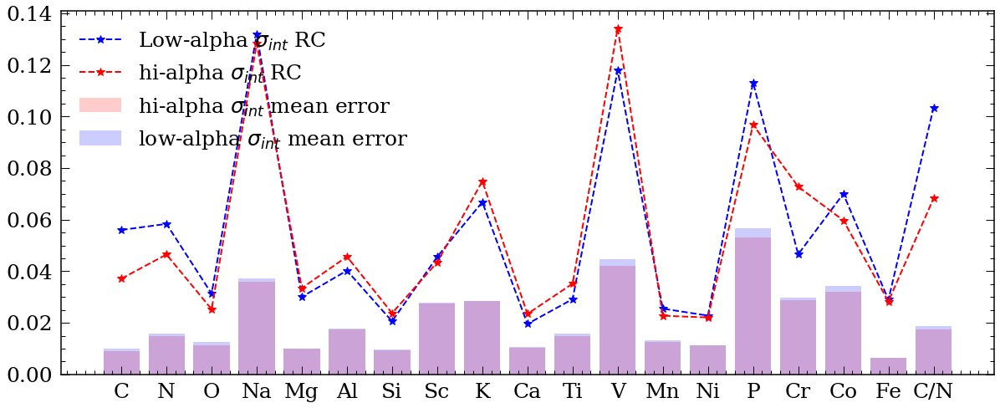

In [70]:
plt.figure(figsize=(20,8))
#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_astro'],'b--o',label='Low-alpha $\sigma_{int}$ Astro',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_astro'],'r--o',label='hi-alpha $\sigma_{int}$ Astro',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_rc'],'b--*',label='Low-alpha $\sigma_{int}$ RC',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_rc'],'r--*',label='hi-alpha $\sigma_{int}$ RC',markersize=10)

#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_all'],'b--.',label='Low-alpha $\sigma_{int}$ all',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_all'],'r--.',label='hi-alpha $\sigma_{int}$ all',markersize=10)

plt.bar(df_disp_plot['Abund'].values,df_disp_plot['ha_err_all'].values,alpha=0.2,
        color='r',label='hi-alpha $\sigma_{int}$ mean error')
plt.bar(df_disp_plot['Abund'].values,df_disp_plot['la_err_all'].values,alpha=0.2,
        color='b',label='low-alpha $\sigma_{int}$ mean error')

plt.legend()
plt.savefig('dispersion_comp_2dpoly_rc.png')

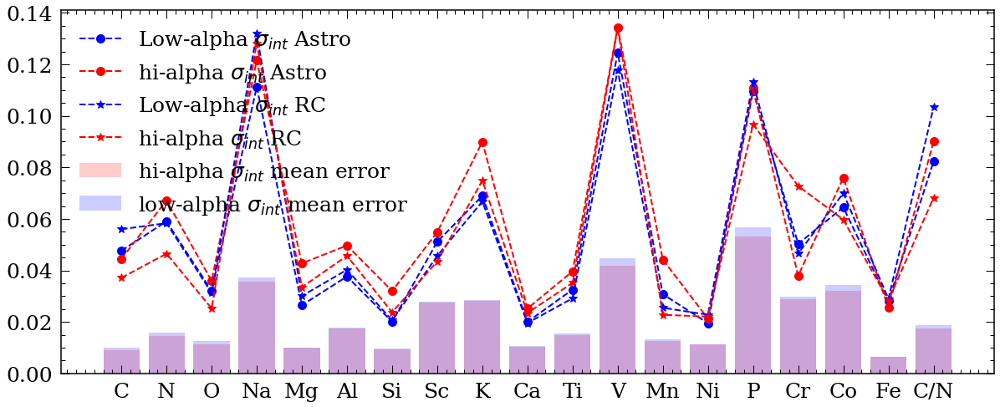

In [71]:
plt.figure(figsize=(20,8))
plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_astro'],'b--o',label='Low-alpha $\sigma_{int}$ Astro',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_astro'],'r--o',label='hi-alpha $\sigma_{int}$ Astro',markersize=10)

plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_rc'],'b--*',label='Low-alpha $\sigma_{int}$ RC',markersize=10)
plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_rc'],'r--*',label='hi-alpha $\sigma_{int}$ RC',markersize=10)

#plt.plot(df_disp_plot['Abund'],df_disp_plot['la_dis_all'],'b--.',label='Low-alpha $\sigma_{int}$ all',markersize=10)
#plt.plot(df_disp_plot['Abund'],df_disp_plot['ha_dis_all'],'r--.',label='hi-alpha $\sigma_{int}$ all',markersize=10)

plt.bar(df_disp_plot['Abund'].values,df_disp_plot['ha_err_all'].values,alpha=0.2,
        color='r',label='hi-alpha $\sigma_{int}$ mean error')
plt.bar(df_disp_plot['Abund'].values,df_disp_plot['la_err_all'].values,alpha=0.2,
        color='b',label='low-alpha $\sigma_{int}$ mean error')

plt.legend()
plt.savefig('dispersion_comp.png')

# calculate gradient for high/low alpha disk

In [47]:
"""
# log age errors
def calcgrad(age,abund,age_err,abund_err):
    zs=np.zeros(100)
    bs=np.zeros(100)
    for i in trange(100):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newage=10**newage/1000
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(newage,newabund,1)
        p=np.poly1d(fits)
        plt.plot(newage,p(newage),'r-',alpha=0.5)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    p=np.poly1d(fits)
    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)
    return np.mean(zs),np.std(zs),np.mean(bs),np.std(bs)
"""
"""
# with age err
def calcgrad(age,abund,age_err,abund_err):
    sampsize=50
    plt.plot(age,abund,'.',markersize=5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(newage,newabund,1)
        #fits=np.polyfit(age,newabund,1)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    return fits[0],np.std(zs),fits[1],np.std(bs)
"""


# without age error
def calcgrad(age,abund,age_err,abund_err):
    sampsize=500
    #plt.plot(age,abund,'.',markersize=5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        fits=np.polyfit(newage,newabund,1,w=1/age_err**2)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1,w=1/age_err**2)
    return fits[0],np.std(zs),fits[1],np.std(bs)
    #return np.mean(zs),np.std(zs),np.mean(bs),np.std(bs)


"""
def calcgrad(age,abund,age_err,abund_err):
    sampsize=100
    plt.errorbar(age,abund,yerr=abund_err,fmt='k.',markersize=5,alpha=0.5)
    zs=np.zeros(sampsize)
    bs=np.zeros(sampsize)
    for i in trange(sampsize):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        
        plt.plot(newage,newabund,'.',markersize=1,alpha=0.5)
        #plt.plot(age,newabund,'.',markersize=5,alpha=0.01)
        fits=np.polyfit(newage,newabund,1)
        #fits=np.polyfit(age,newabund,1)
        p=np.poly1d(fits)
        plt.plot(newage,p(newage),'r-',alpha=0.5)
        #plt.plot(age,p(age),'r-',alpha=0.5)
        zs[i] = fits[0]
        bs[i] = fits[1]
    fits=np.polyfit(age,abund,1)
    p=np.poly1d(fits)
    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)
    print(np.mean(zs))
    print(fits[0])
    return fits[0],np.std(zs),fits[1],np.std(bs)
"""


"\ndef calcgrad(age,abund,age_err,abund_err):\n    sampsize=100\n    plt.errorbar(age,abund,yerr=abund_err,fmt='k.',markersize=5,alpha=0.5)\n    zs=np.zeros(sampsize)\n    bs=np.zeros(sampsize)\n    for i in trange(sampsize):\n        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])\n        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])\n        \n        plt.plot(newage,newabund,'.',markersize=1,alpha=0.5)\n        #plt.plot(age,newabund,'.',markersize=5,alpha=0.01)\n        fits=np.polyfit(newage,newabund,1)\n        #fits=np.polyfit(age,newabund,1)\n        p=np.poly1d(fits)\n        plt.plot(newage,p(newage),'r-',alpha=0.5)\n        #plt.plot(age,p(age),'r-',alpha=0.5)\n        zs[i] = fits[0]\n        bs[i] = fits[1]\n    fits=np.polyfit(age,abund,1)\n    p=np.poly1d(fits)\n    plt.plot(age,p(age),'k-',alpha=0.5,linewidth=5)\n    print(np.mean(zs))\n    print(fits[0])\n    return fits[0],np.std(zs

In [48]:
def getgrad(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}


    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #

    Abunname=[]
    grad_la=[]
    grad_la_err=[]
    
    grad_ha=[]
    grad_ha_err=[]
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        print(abun_apog[i])
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<8]
        #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<5]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        #df_plot_la=df_plot_la.loc[df_plot_la['Age']<8]
        #df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<5]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        #print('errer',df_plot_ha['Age_err'])
    
        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
        if len(df_plot_la)==0 or len(df_plot_ha)==0:
            continue

        z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la[abun_apog[i]].values,
                         df_plot_la['Age_err'].values,df_plot_la[abun_apog[i]+'_ERR'].values)
        z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha[abun_apog[i]].values,
                         df_plot_ha['Age_err'].values,df_plot_ha[abun_apog[i]+'_ERR'].values)
        
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['Age'],df_plot_la[abun_apog[i]].values,yerr=df_plot_la[abun_apog[i]+'_ERR'].values,
                     fmt='bo',alpha=0.05,label='low-$\\alpha$',markersize=1)
        plt.errorbar(df_plot_ha['Age'],df_plot_ha[abun_apog[i]].values,yerr=df_plot_ha[abun_apog[i]+'_ERR'].values,
                     fmt='ro',alpha=0.05,label='high-$\\alpha$',markersize=1)
        plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
        plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Age [Gyr]')
        Abunname.append(abund[abun_apog[i]]+'Fe]')
        grad_la.append(z_la)
        grad_la_err.append(z_la_err)
        grad_ha.append(z_ha)
        grad_ha_err.append(z_ha_err)
        
 
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la['M_H'].values,
                         df_plot_la['Age_err'].values,df_plot_la['M_H_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha['M_H'].values,
                         df_plot_ha['Age_err'].values,df_plot_ha['M_H_ERR'].values)
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['M_H'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['M_H_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['M_H'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['M_H_ERR'])
    """
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['Age'],df_plot_la['M_H'],yerr=df_plot_la['M_H_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['M_H'],yerr=df_plot_ha['M_H_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
        
    Abunname.append('Fe')
    plt.ylabel('Fe')
    plt.xlabel('Age [Gyr]')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
        
        
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<8]
    #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<5]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    #df_plot_la=df_plot_la.loc[df_plot_la['Age']<8]
    #df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<5]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['Age'].values,df_plot_la['C_N'].values,
                         df_plot_la['Age_err'].values,df_plot_la['C_N_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['Age'].values,df_plot_ha['C_N'].values,
                         df_plot_ha['Age_err'].values,df_plot_ha['C_N_ERR'].values)
    
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['C_N'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['C_N_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['C_N'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['C_N_ERR'])
    """
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['Age'],df_plot_la['C_N'],yerr=df_plot_la['C_N_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['Age'],df_plot_ha['C_N'],yerr=df_plot_ha['C_N_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['Age'],z_la*df_plot_la['Age']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['Age'],z_ha*df_plot_ha['Age']+b_ha,'r--',linewidth=5)
    
    Abunname.append('[C/N]')
    plt.ylabel('[C/N]')
    plt.xlabel('Age [Gyr]')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
    plt.tight_layout()
    return grad_la, grad_la_err, grad_ha, grad_ha_err, Abunname

In [81]:
def getgrad_log(df_abun_st_ha,df_abun_st_la):
    abun_apog=['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','S_FE','K_FE','CA_FE','TI_FE',
           'V_FE','MN_FE','NI_FE','P_FE','CR_FE','CO_FE','RB_FE']

    abun_apog_err=[i+'_ERR' for i in abun_apog]

    abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/','O_FE':'[O/','NA_FE':'[Na/','K_FE':'[K/','V_FE':'[V/',
      'P_FE':'[P/','RB_FE':'[Rb/','N_FE':'[N/','M_H':'[Fe/'}


    ## running median parameters
    agewindow=0.5
    slidwindow=0.1

    # **************************************** #

    Abunname=[]
    grad_la=[]
    grad_la_err=[]
    
    grad_ha=[]
    grad_ha_err=[]
    plt.figure(figsize=(22.5,25))
    for i in range(1,len(abun_apog)):
        clear_output(wait = True)
        print(abun_apog[i])
        df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha[abun_apog[i]]>-100]
        #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<8]
        #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<5]
        df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    
        df_plot_la=df_abun_st_la.loc[df_abun_st_la[abun_apog[i]]>-100]
        #df_plot_la=df_plot_la.loc[df_plot_la['Age']<8]
        #df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<5]
        df_plot_la=df_plot_la.reset_index(drop=True)
    
        #print('errer',df_plot_ha['Age_err'])
    
        df_plot_la=df_plot_la.sort_values(by=['Age'])
        df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
        if len(df_plot_la)==0 or len(df_plot_ha)==0:
            continue

        z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'].values,df_plot_la[abun_apog[i]].values,
                         np.sqrt(df_plot_la['LogAge_err'].values**2+0.2**2),df_plot_la[abun_apog[i]+'_ERR'].values)
        z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'].values,df_plot_ha[abun_apog[i]].values,
                         np.sqrt(df_plot_ha['LogAge_err'].values**2+0.2**2),df_plot_ha[abun_apog[i]+'_ERR'].values)
        
        plt.subplot(5,4,i+1)
        plt.errorbar(df_plot_la['LogAge'],df_plot_la[abun_apog[i]].values,yerr=df_plot_la[abun_apog[i]+'_ERR'].values,
                     fmt='bo',alpha=0.05,label='low-$\\alpha$',markersize=1)
        plt.errorbar(df_plot_ha['LogAge'],df_plot_ha[abun_apog[i]].values,yerr=df_plot_ha[abun_apog[i]+'_ERR'].values,
                     fmt='ro',alpha=0.05,label='high-$\\alpha$',markersize=1)
        plt.plot(df_plot_la['LogAge'],z_la*df_plot_la['LogAge']+b_la,'b--',linewidth=5)
        plt.plot(df_plot_ha['LogAge'],z_ha*df_plot_ha['LogAge']+b_ha,'r--',linewidth=5)
        plt.ylabel(abund[abun_apog[i]]+'Fe]')
        plt.xlabel('Log Age')
        Abunname.append(abund[abun_apog[i]]+'Fe]')
        grad_la.append(z_la)
        grad_la_err.append(z_la_err)
        grad_ha.append(z_ha)
        grad_ha_err.append(z_ha_err)
        
 
    # For Fe
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['M_H']>-100]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['M_H']>-100]
    df_plot_la=df_plot_la.reset_index(drop=True)
    
    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'].values,df_plot_la['M_H'].values,
                         np.sqrt(df_plot_la['LogAge_err'].values**2+0.2**2),df_plot_la['M_H_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'].values,df_plot_ha['M_H'].values,
                         np.sqrt(df_plot_ha['LogAge_err'].values**2+0.2**2),df_plot_ha['M_H_ERR'].values)
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['M_H'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['M_H_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['M_H'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['M_H_ERR'])
    """
    plt.subplot(5,4,1)
    plt.errorbar(df_plot_la['LogAge'],df_plot_la['M_H'],yerr=df_plot_la['M_H_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['LogAge'],df_plot_ha['M_H'],yerr=df_plot_ha['M_H_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['LogAge'],z_la*df_plot_la['LogAge']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['LogAge'],z_ha*df_plot_ha['LogAge']+b_ha,'r--',linewidth=5)
        
    Abunname.append('Fe')
    plt.ylabel('Fe')
    plt.xlabel('Log Age')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
        
        
    # for C/N
    df_plot_ha=df_abun_st_ha.loc[df_abun_st_ha['C_FE']>-100]
    df_plot_ha=df_plot_ha.loc[df_plot_ha['N_FE']>-100]
    df_plot_ha['C_N']=df_plot_ha['C_FE']-df_plot_ha['N_FE']
    df_plot_ha['C_N_ERR']=np.sqrt(df_plot_ha['C_FE_ERR']**2.+df_plot_ha['N_FE_ERR']**2.)
    #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age']<8]
    #df_plot_ha=df_plot_ha.loc[df_plot_ha['Age_err']<5]
    df_plot_ha=df_plot_ha.reset_index(drop=True)
    
    df_plot_la=df_abun_st_la.loc[df_abun_st_la['C_FE']>-100]
    df_plot_la=df_plot_la.loc[df_plot_la['N_FE']>-100]
    df_plot_la['C_N']=df_plot_la['C_FE']-df_plot_la['N_FE']
    df_plot_la['C_N_ERR']=np.sqrt(df_plot_la['C_FE_ERR']**2.+df_plot_la['N_FE_ERR']**2.)
    #df_plot_la=df_plot_la.loc[df_plot_la['Age']<8]
    #df_plot_la=df_plot_la.loc[df_plot_la['Age_err']<5]
    df_plot_la=df_plot_la.reset_index(drop=True)

    df_plot_la=df_plot_la.sort_values(by=['Age'])
    df_plot_ha=df_plot_ha.sort_values(by=['Age'])    
    
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'].values,df_plot_la['C_N'].values,
                         np.sqrt(df_plot_la['LogAge_err'].values**2+0.2**2),df_plot_la['C_N_ERR'].values)
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'].values,df_plot_ha['C_N'].values,
                         np.sqrt(df_plot_ha['LogAge_err'].values**2+0.2**2),df_plot_ha['C_N_ERR'].values)
    
    """
    z_la,z_la_err,b_la,b_la_err=calcgrad(df_plot_la['LogAge'],df_plot_la['C_N'],
                         np.sqrt(df_plot_la['LogAge_err']**2+0.2**2),df_plot_la['C_N_ERR'])
    z_ha,z_ha_err,b_ha,b_ha_err=calcgrad(df_plot_ha['LogAge'],df_plot_ha['C_N'],
                         np.sqrt(df_plot_ha['LogAge_err']**2+0.2**2),df_plot_ha['C_N_ERR'])
    """
    plt.subplot(5,4,20)
    plt.errorbar(df_plot_la['LogAge'],df_plot_la['C_N'],yerr=df_plot_la['C_N_ERR'],fmt='bo',
                 alpha=0.05,label='low-$\\alpha$',markersize=1)
    plt.errorbar(df_plot_ha['LogAge'],df_plot_ha['C_N'],yerr=df_plot_ha['C_N_ERR'],fmt='ro',
                 alpha=0.05,label='high-$\\alpha$',markersize=1)
    plt.plot(df_plot_la['LogAge'],z_la*df_plot_la['LogAge']+b_la,'b--',linewidth=5)
    plt.plot(df_plot_ha['LogAge'],z_ha*df_plot_ha['LogAge']+b_ha,'r--',linewidth=5)
    
    Abunname.append('[C/N]')
    plt.ylabel('[C/N]')
    plt.xlabel('Log Age')
    grad_la.append(z_la)
    grad_la_err.append(z_la_err)
    grad_ha.append(z_ha)
    grad_ha_err.append(z_ha_err)
    plt.tight_layout()
    return grad_la, grad_la_err, grad_ha, grad_ha_err, Abunname

In [78]:
#max(df_abun_st_ha['Age'])
df_abun_st_ha=df_abun_st_ha.loc[df_abun_st_ha['Age']<10].reset_index(drop=True)
df_abun_st_la=df_abun_st_la.loc[df_abun_st_la['Age']<10].reset_index(drop=True)

  1%|          | 4/500 [00:00<00:12, 39.71it/s]

RB_FE


100%|██████████| 500/500 [00:01<00:00, 312.20it/s]


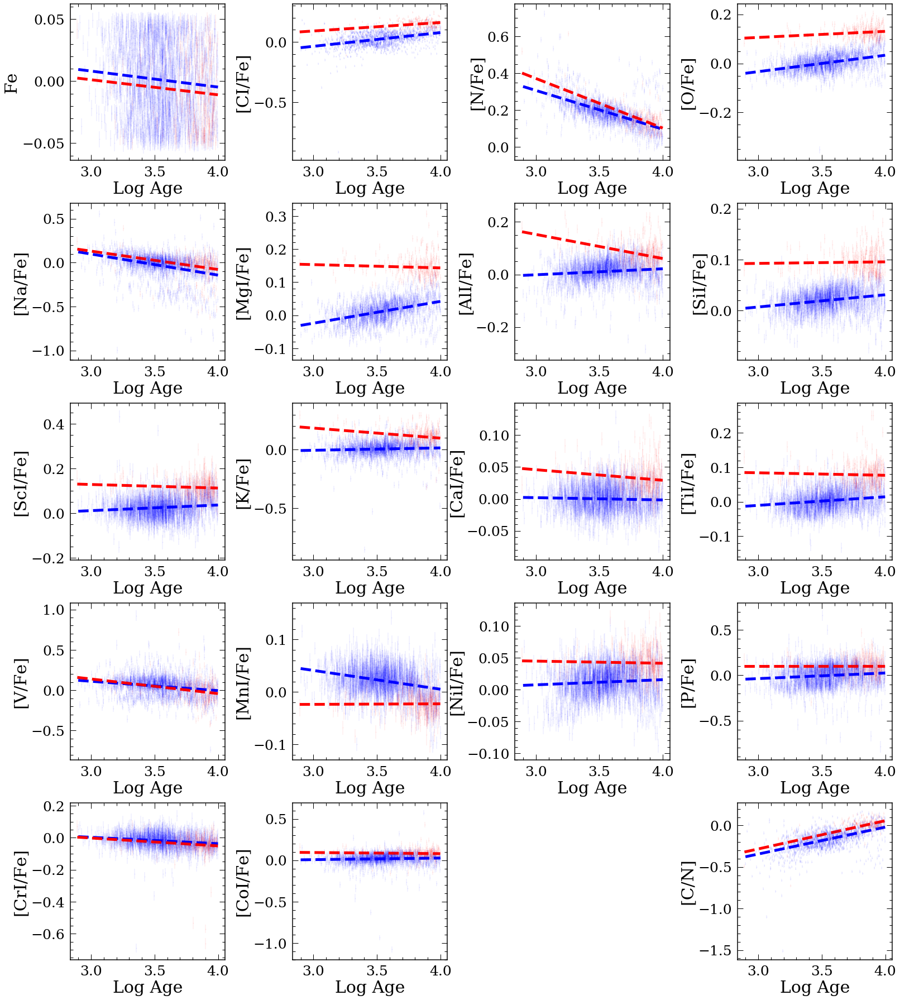

In [82]:
grad_la_log, grad_la_err_log, grad_ha_log, grad_ha_err_log, Abunname_log = getgrad_log(df_abun_st_ha,df_abun_st_la)




  1%|          | 4/500 [00:00<00:12, 38.82it/s]

RB_FE


100%|██████████| 500/500 [00:01<00:00, 296.97it/s]


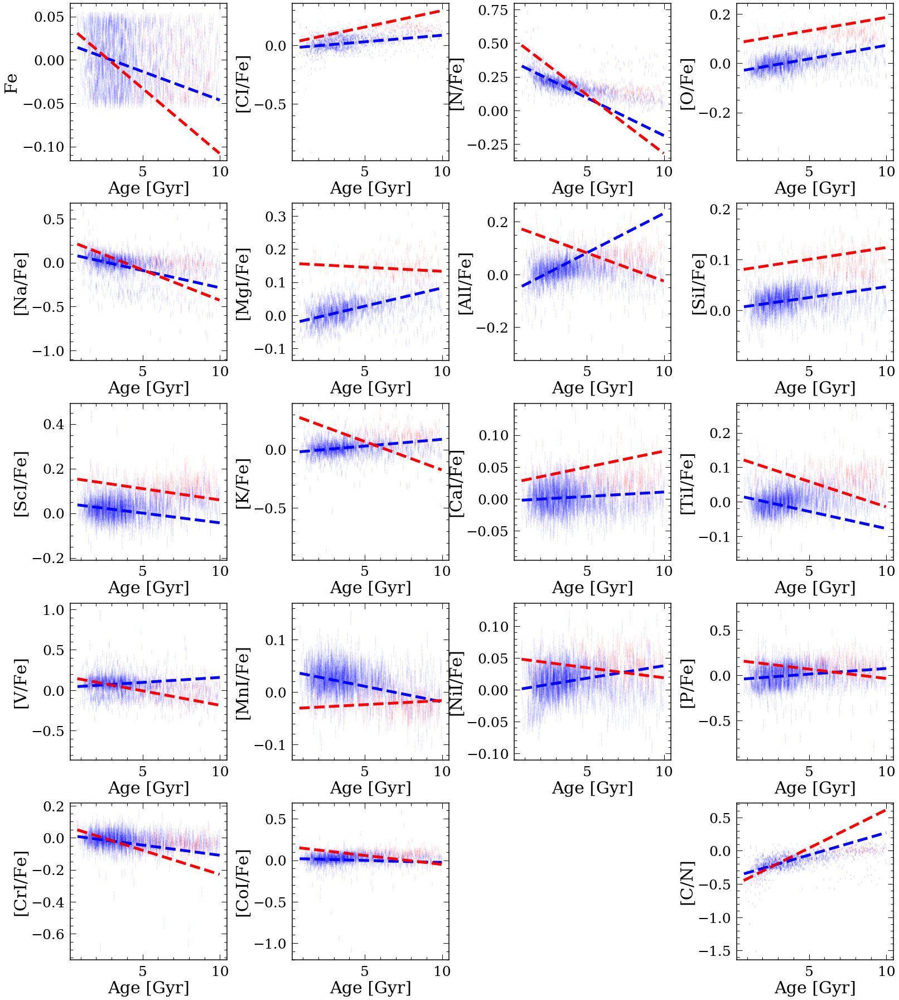

In [63]:
grad_la, grad_la_err, grad_ha, grad_ha_err, Abunname = getgrad(df_abun_st_ha,df_abun_st_la)



In [97]:
Abunname=[i.split('/')[0].split('[')[-1] for i in Abunname]

In [96]:
Abunname_log=[i.split('/')[0].split('[')[-1] for i in Abunname_log]

['C',
 'CH',
 'O',
 'Na',
 'Mg',
 'Al',
 'Si',
 'Sc',
 'Ca',
 'Ca',
 'Ti',
 'Ti',
 'Mn',
 'Ni',
 'CrI',
 'Cr',
 'Co',
 'Co',
 'Ni',
 'CuI',
 'ZnI',
 'SrI',
 'YII',
 'ZrII',
 'BaII',
 'LaII',
 'CeII',
 'PrII',
 'NdII',
 'SmII',
 'EuII',
 'GdII',
 'C']

In [116]:
Abunname[0]='C'
Abunname_log[-1]='C/N'
Abunname[4]='Mg'
Abunname[5]='Al'
Abunname[6]='Si'
Abunname[7]='Sc'
Abunname[9]='Ca'
Abunname[10]='Ti'
Abunname[12]='Mn'
Abunname[13]='Ni'
Abunname[15]='Cr'
Abunname[16]='Co'

Abunname_log[0]='C'
Abunname_log[-1]='C/N'
Abunname_log[4]='Mg'
Abunname_log[5]='Al'
Abunname_log[6]='Si'
Abunname_log[7]='Sc'
Abunname_log[9]='Ca'
Abunname_log[10]='Ti'
Abunname_log[12]='Mn'
Abunname_log[13]='Ni'
Abunname_log[15]='Cr'
Abunname_log[16]='Co'

#Abunname[-1]='C/N'
"""
df_grad_log=pd.DataFrame(np.array((Abunname, grad_la_log, grad_la_err_log, grad_ha_log, grad_ha_err_log)).T,
                     columns=['Abund','la_grad_log','la_grad_err_log','ha_grad_log','ha_grad_err_log'])
"""
df_grad=pd.DataFrame(np.array((Abunname_log, grad_la, grad_la_err, grad_ha, grad_ha_err, grad_la_log, 
                               grad_la_err_log, grad_ha_log, grad_ha_err_log)).T,
                     columns=['Abund','la_grad','la_grad_err','ha_grad','ha_grad_err','la_grad_log',
                              'la_grad_err_log','ha_grad_log','ha_grad_err_log'])

df_grad


,Abund,la_grad,la_grad_err,ha_grad,ha_grad_err,la_grad_log,la_grad_err_log,ha_grad_log,ha_grad_err_log
0,C,0.011100114879378552,0.0036787546911379956,0.028047041149943216,0.004355574500834556,0.11354367311236091,0.0033477649983837316,0.0700885101845713,0.007022249781464087
1,N,-0.05616064858564064,0.003644058041539861,-0.08722200879040753,0.00947141475826839,-0.21078945409756877,0.003869393848853739,-0.2698017738312173,0.011011997373051866
2,O,0.01100914810362726,0.0014311224756192028,0.010758197442149108,0.0036775581303551087,0.06673314235314771,0.0020051066551541245,0.024790558489053226,0.005226493691391738
3,Na,-0.03938143761428111,0.004209290002648488,-0.0694435103375882,0.013415341514335074,-0.23961337861554097,0.008037813999276182,-0.20880759702737373,0.02526305963095953
4,Mg,0.011033604148100786,0.0014268223366469867,-0.0024749243350419376,0.0029275080722098515,0.06595224244239485,0.0019158153586889123,-0.009902989136900709,0.006200590454933552
5,Al,0.030206306723939622,0.002177995073808565,-0.021505019292224745,0.005215614658573609,0.022777046950425223,0.0027366024941047505,-0.09179944242952189,0.009099324884054074
6,Si,0.004270566063454975,0.0009649270307512506,0.004652508679441365,0.0024753530368185916,0.024008675780101636,0.001379657328142703,0.0030155621234319824,0.00471068486574107
7,Sc,-0.008719094103684183,0.002100801602215542,-0.010122440289746213,0.007000578221327582,0.025149000327123493,0.003219726898349226,-0.01595580015826542,0.009925710881053058
8,K,0.011577250055369026,0.002802186112946318,-0.0487315807645342,0.009282712308243207,0.020455474218019663,0.004281354046328952,-0.08606840766279943,0.013883542424795243
9,Ca,0.001392092951311446,0.00084998248827121,0.005041746311191027,0.003079779971550917,-0.0035959016515350987,0.0012794632571041277,-0.01658694546861812,0.004589542856951126


In [117]:
df_disp_plot=pd.merge(df_disp,df_disp_rc,left_on='Abund',right_on='Abund',how='inner')
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc
0,C,0.04761980972628173,0.04443719540113884,0.055356525227238836,0.03793984294829292
1,N,0.059048856931277045,0.0671889677193397,0.06987410576967307,0.05097099887966888
2,O,0.03205555576941135,0.03590770197117728,0.03267171425924065,0.025187654045629154
3,Na,0.11124790871760286,0.12152227661338773,0.13744448413291485,0.13451227065198693
4,Mg,0.026475810689559526,0.042710812182841486,0.031648783557384964,0.0326273924711862
5,Al,0.03763542095492403,0.049700768827242524,0.04300936191044131,0.048893582525441515
6,Si,0.020087312383594992,0.03198190566337223,0.02122095167579488,0.023073511655121955
7,Sc,0.051109780633064816,0.05485597879547499,0.04722231694639768,0.04415146827773869
8,K,0.06891900134281731,0.08995127458325361,0.06783822464088231,0.07633070019350677
9,Ca,0.02002360234710912,0.025202453341524822,0.020100848714184927,0.02282919100792869


In [118]:
df_grad

,Abund,la_grad,la_grad_err,ha_grad,ha_grad_err,la_grad_log,la_grad_err_log,ha_grad_log,ha_grad_err_log
0,C,0.011100114879378552,0.0036787546911379956,0.028047041149943216,0.004355574500834556,0.11354367311236091,0.0033477649983837316,0.0700885101845713,0.007022249781464087
1,N,-0.05616064858564064,0.003644058041539861,-0.08722200879040753,0.00947141475826839,-0.21078945409756877,0.003869393848853739,-0.2698017738312173,0.011011997373051866
2,O,0.01100914810362726,0.0014311224756192028,0.010758197442149108,0.0036775581303551087,0.06673314235314771,0.0020051066551541245,0.024790558489053226,0.005226493691391738
3,Na,-0.03938143761428111,0.004209290002648488,-0.0694435103375882,0.013415341514335074,-0.23961337861554097,0.008037813999276182,-0.20880759702737373,0.02526305963095953
4,Mg,0.011033604148100786,0.0014268223366469867,-0.0024749243350419376,0.0029275080722098515,0.06595224244239485,0.0019158153586889123,-0.009902989136900709,0.006200590454933552
5,Al,0.030206306723939622,0.002177995073808565,-0.021505019292224745,0.005215614658573609,0.022777046950425223,0.0027366024941047505,-0.09179944242952189,0.009099324884054074
6,Si,0.004270566063454975,0.0009649270307512506,0.004652508679441365,0.0024753530368185916,0.024008675780101636,0.001379657328142703,0.0030155621234319824,0.00471068486574107
7,Sc,-0.008719094103684183,0.002100801602215542,-0.010122440289746213,0.007000578221327582,0.025149000327123493,0.003219726898349226,-0.01595580015826542,0.009925710881053058
8,K,0.011577250055369026,0.002802186112946318,-0.0487315807645342,0.009282712308243207,0.020455474218019663,0.004281354046328952,-0.08606840766279943,0.013883542424795243
9,Ca,0.001392092951311446,0.00084998248827121,0.005041746311191027,0.003079779971550917,-0.0035959016515350987,0.0012794632571041277,-0.01658694546861812,0.004589542856951126


In [129]:
df_disp_plot=pd.merge(df_disp,df_disp_rc,left_on='Abund',right_on='Abund',how='inner')

for i in df_disp_plot.columns:
    if i!='Abund':
        df_disp_plot[i]=[float(j) for j in df_disp_plot[i]]
        
df_disp_plot['Abund'].iloc[18]='C/N'
df_disp_plot=pd.merge(df_disp_plot,df_grad,left_on='Abund',right_on='Abund',how='inner')
df_disp_plot['la_grad']=[float(i) for i in df_disp_plot['la_grad']]
df_disp_plot['la_grad_err']=[float(i) for i in df_disp_plot['la_grad_err']]
df_disp_plot['ha_grad']=[float(i) for i in df_disp_plot['ha_grad']]
df_disp_plot['ha_grad_err']=[float(i) for i in df_disp_plot['ha_grad_err']]
df_disp_plot['la_grad_log']=[float(i) for i in df_disp_plot['la_grad_log']]
df_disp_plot['la_grad_err_log']=[float(i) for i in df_disp_plot['la_grad_err_log']]
df_disp_plot['ha_grad_log']=[float(i) for i in df_disp_plot['ha_grad_log']]
df_disp_plot['ha_grad_err_log']=[float(i) for i in df_disp_plot['ha_grad_err_log']]

/Users/lucy/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [130]:
#df_disp_plot.to_pickle('intrinsic.pkl')
df_disp_plot['diff']=abs(df_disp_plot['la_grad']-df_disp_plot['ha_grad'])

In [131]:
df_disp_plot=df_disp_plot.sort_values(by='diff',ascending=False)

In [132]:
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc,la_grad,la_grad_err,ha_grad,ha_grad_err,la_grad_log,la_grad_err_log,ha_grad_log,ha_grad_err_log,diff
8,K,0.068919,0.089951,0.067838,0.076331,0.011577,0.002802,-0.048732,0.009283,0.020455,0.004281,-0.086068,0.013884,0.060309
5,Al,0.037635,0.049701,0.043009,0.048894,0.030206,0.002178,-0.021505,0.005216,0.022777,0.002737,-0.091799,0.009099,0.051711
11,V,0.124560,0.134410,0.120013,0.131012,0.012332,0.004659,-0.035805,0.012995,-0.115134,0.007722,-0.180803,0.025070,0.048138
18,C/N,0.082279,0.090028,0.109878,0.074153,0.067261,0.006957,0.115269,0.012698,0.324333,0.006573,0.339890,0.015109,0.048008
14,P,0.109705,0.110764,0.115319,0.093366,0.012566,0.004960,-0.020684,0.014729,0.061808,0.008023,0.000635,0.021377,0.033250
1,N,0.059049,0.067189,0.069874,0.050971,-0.056161,0.003644,-0.087222,0.009471,-0.210789,0.003869,-0.269802,0.011012,0.031061
3,Na,0.111248,0.121522,0.137444,0.134512,-0.039381,0.004209,-0.069444,0.013415,-0.239613,0.008038,-0.208808,0.025263,0.030062
15,Cr,0.050328,0.037921,0.046765,0.068993,-0.012743,0.002074,-0.030226,0.008952,-0.039824,0.003595,-0.049207,0.014554,0.017483
0,C,0.047620,0.044437,0.055357,0.037940,0.011100,0.003679,0.028047,0.004356,0.113544,0.003348,0.070089,0.007022,0.016947
16,Co,0.064498,0.075930,0.070093,0.062954,-0.004931,0.002719,-0.021645,0.009366,0.019073,0.004730,-0.013551,0.013198,0.016713


In [133]:
bedellM=pd.read_csv('bedell_m.csv')
Abunname=bedellM['Species'].values
Abunname[0]='C'
Abunname[4]='Mg'
Abunname[5]='Al'
Abunname[6]='Si'
Abunname[9]='Sc'
Abunname[8]='Ca'
Abunname[11]='Ti'
Abunname[16]='Mn'
Abunname[18]='Ni'
Abunname[17]='Co'
bedellM['Species']=Abunname
bedellM

,Species,m,m_err,b,s,s_err
0,C,0.0115,0.0014,-0.0747,0.0394,0.0044
1,CH,0.0115,0.0014,-0.0861,0.0293,0.0030
2,O,0.0088,0.0014,-0.0185,0.0238,0.0028
3,Na,0.0086,0.0016,-0.0525,0.0273,0.0029
4,Mg,0.0099,0.0009,-0.0319,0.0121,0.0018
5,Al,0.0139,0.0010,-0.0541,0.0156,0.0019
6,Si,0.0063,0.0006,-0.0275,0.0110,0.0011
7,SI,0.0098,0.0015,-0.0452,0.0240,0.0035
8,Ca,-0.0005,0.0000,0.0217 + 0.0032,0.0089,0.0011
9,Sc,0.0059,0.0009,-0.0211,0.0159,0.0022


In [134]:
df_disp_plot=pd.merge(df_disp_plot,bedellM[['Species','m','m_err','s','s_err']],left_on='Abund',right_on='Species',how='left')
df_disp_plot

,Abund,la_dis_astro,ha_dis_astro,la_dis_rc,ha_dis_rc,la_grad,la_grad_err,ha_grad,ha_grad_err,la_grad_log,la_grad_err_log,ha_grad_log,ha_grad_err_log,diff,Species,m,m_err,s,s_err
0,K,0.068919,0.089951,0.067838,0.076331,0.011577,0.002802,-0.048732,0.009283,0.020455,0.004281,-0.086068,0.013884,0.060309,NaN,NaN,NaN,NaN,NaN
1,Al,0.037635,0.049701,0.043009,0.048894,0.030206,0.002178,-0.021505,0.005216,0.022777,0.002737,-0.091799,0.009099,0.051711,Al,0.0139,0.0010,0.0156,0.0019
2,V,0.124560,0.134410,0.120013,0.131012,0.012332,0.004659,-0.035805,0.012995,-0.115134,0.007722,-0.180803,0.025070,0.048138,V,0.0013,0.0007,0.0091,0.0011
3,C/N,0.082279,0.090028,0.109878,0.074153,0.067261,0.006957,0.115269,0.012698,0.324333,0.006573,0.339890,0.015109,0.048008,NaN,NaN,NaN,NaN,NaN
4,P,0.109705,0.110764,0.115319,0.093366,0.012566,0.004960,-0.020684,0.014729,0.061808,0.008023,0.000635,0.021377,0.033250,NaN,NaN,NaN,NaN,NaN
5,N,0.059049,0.067189,0.069874,0.050971,-0.056161,0.003644,-0.087222,0.009471,-0.210789,0.003869,-0.269802,0.011012,0.031061,NaN,NaN,NaN,NaN,NaN
6,Na,0.111248,0.121522,0.137444,0.134512,-0.039381,0.004209,-0.069444,0.013415,-0.239613,0.008038,-0.208808,0.025263,0.030062,Na,0.0086,0.0016,0.0273,0.0029
7,Cr,0.050328,0.037921,0.046765,0.068993,-0.012743,0.002074,-0.030226,0.008952,-0.039824,0.003595,-0.049207,0.014554,0.017483,NaN,NaN,NaN,NaN,NaN
8,C,0.047620,0.044437,0.055357,0.037940,0.011100,0.003679,0.028047,0.004356,0.113544,0.003348,0.070089,0.007022,0.016947,C,0.0115,0.0014,0.0394,0.0044
9,Co,0.064498,0.075930,0.070093,0.062954,-0.004931,0.002719,-0.021645,0.009366,0.019073,0.004730,-0.013551,0.013198,0.016713,Co,0.0074,0.0011,0.0178,0.0020


In [135]:
#df_disp_plot=pd.merge(df_disp_plot,df_grad,right_on='Abund',left_on='Abund',how='inner')

In [136]:

df_abun_st_ha['C_N']=df_abun_st_ha['C_FE']-df_abun_st_ha['N_FE']
df_abun_st_ha['C_N_ERR']=np.sqrt(df_abun_st_ha['C_FE_ERR']**2.+df_abun_st_ha['N_FE_ERR']**2.)


df_abun_st_la['C_N']=df_abun_st_la['C_FE']-df_abun_st_la['N_FE']
df_abun_st_la['C_N_ERR']=np.sqrt(df_abun_st_la['C_FE_ERR']**2.+df_abun_st_la['N_FE_ERR']**2.)



elements=['C_N','C_FE','N_FE','AL_FE','MG_FE','K_FE','O_FE','V_FE','CO_FE','SI_FE','TI_FE','CA_FE',
          'MN_FE','P_FE','NI_FE','S_FE','CR_FE','M_H','NA_FE']
 
ha_err=[]
la_err=[]
for i in elements:
    df_abun_st_ha=df_abun_st_ha.loc[df_abun_st_ha[i+"_ERR"]>0]
    df_abun_st_la=df_abun_st_la.loc[df_abun_st_la[i+"_ERR"]>0]
    ha_err.append(np.mean(df_abun_st_ha[i+"_ERR"].dropna()))
    la_err.append(np.mean(df_abun_st_la[i+"_ERR"].dropna()))
    
df_disp_plot['ha_err_all']=ha_err
df_disp_plot['la_err_all']=la_err

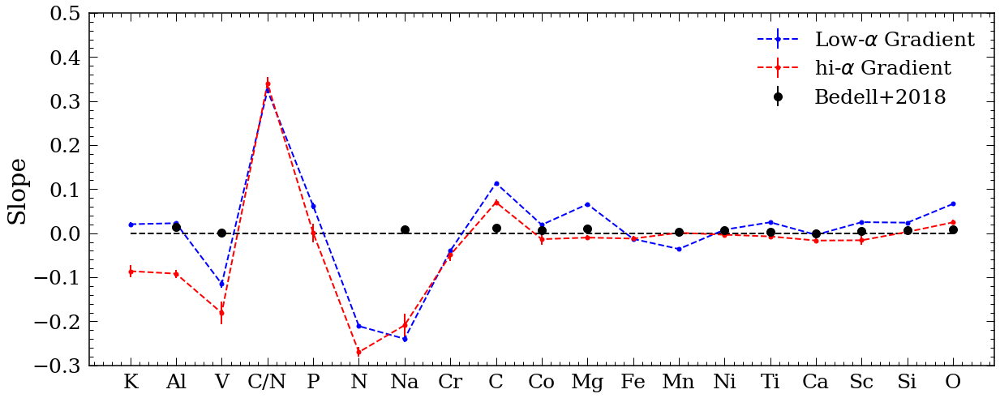

In [139]:
# differnt metalicity
# get rid of stars with age error > 5 gyr
plt.figure(figsize=(20,8))
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['la_grad_log'],yerr=df_disp_plot['la_grad_err_log'],
             fmt='bo--',label='Low-$\\alpha$ Gradient',markersize=5)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['ha_grad_log'],yerr=df_disp_plot['ha_grad_err_log'],
             fmt='ro--',label='hi-$\\alpha$ Gradient',markersize=5)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['m'],yerr=df_disp_plot['m_err'],
             fmt='ko',label='Bedell+2018',markersize=10)
plt.plot(df_disp_plot['Abund'],np.zeros(len(df_disp_plot['Abund'])),'k--')

plt.ylim([-0.3,0.5])
plt.ylabel('Slope')
plt.legend()
#plt.savefig('slopes.png')

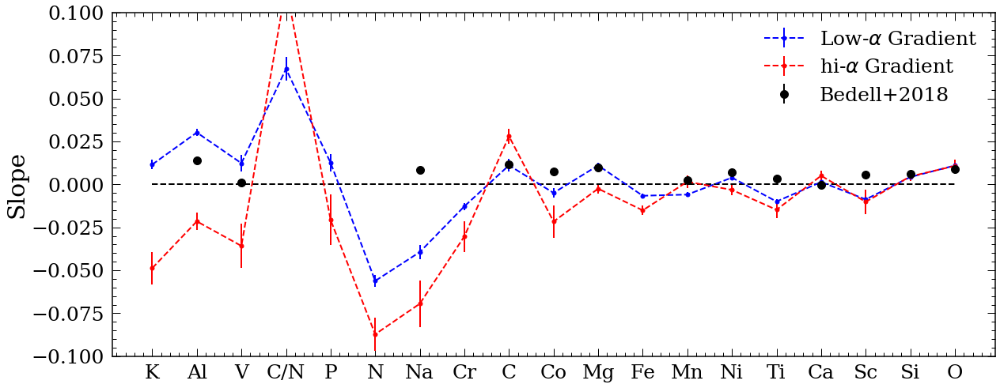

In [140]:
# differnt metalicity
# get rid of stars with age error > 5 gyr
plt.figure(figsize=(20,8))
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['la_grad'],yerr=df_disp_plot['la_grad_err'],
             fmt='bo--',label='Low-$\\alpha$ Gradient',markersize=5)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['ha_grad'],yerr=df_disp_plot['ha_grad_err'],
             fmt='ro--',label='hi-$\\alpha$ Gradient',markersize=5)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['m'],yerr=df_disp_plot['m_err'],
             fmt='ko',label='Bedell+2018',markersize=10)
plt.plot(df_disp_plot['Abund'],np.zeros(len(df_disp_plot['Abund'])),'k--')

plt.ylim([-0.1,0.1])
plt.ylabel('Slope')
plt.legend()
#plt.savefig('slopes.png')

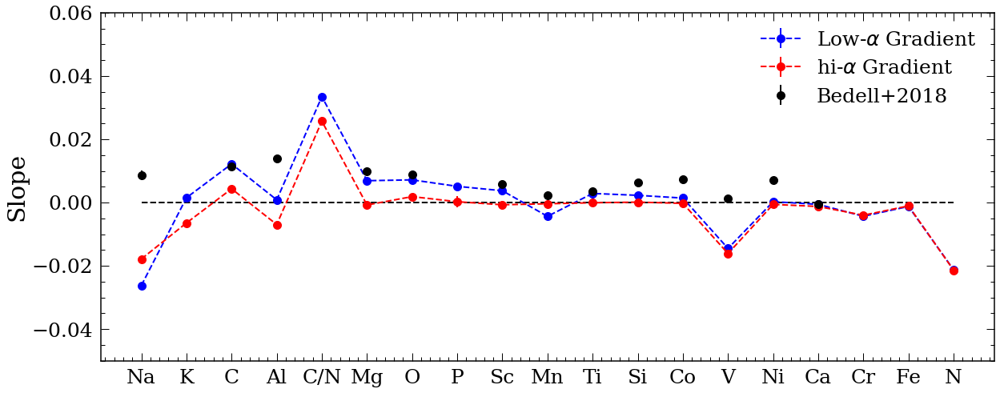

In [194]:
# differnt metalicity
# all stars
plt.figure(figsize=(20,8))
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['la_grad'],yerr=df_disp_plot['la_grad_err'],
             fmt='bo--',label='Low-$\\alpha$ Gradient',markersize=10)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['ha_grad'],yerr=df_disp_plot['ha_grad_err'],
             fmt='ro--',label='hi-$\\alpha$ Gradient',markersize=10)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['m'],yerr=df_disp_plot['m_err'],
             fmt='ko',label='Bedell+2018',markersize=10)
plt.plot(df_disp_plot['Abund'],np.zeros(len(df_disp_plot['Abund'])),'k--')

plt.ylim([-0.05,0.06])
plt.ylabel('Slope')
plt.legend()
#plt.savefig('slopes.png')

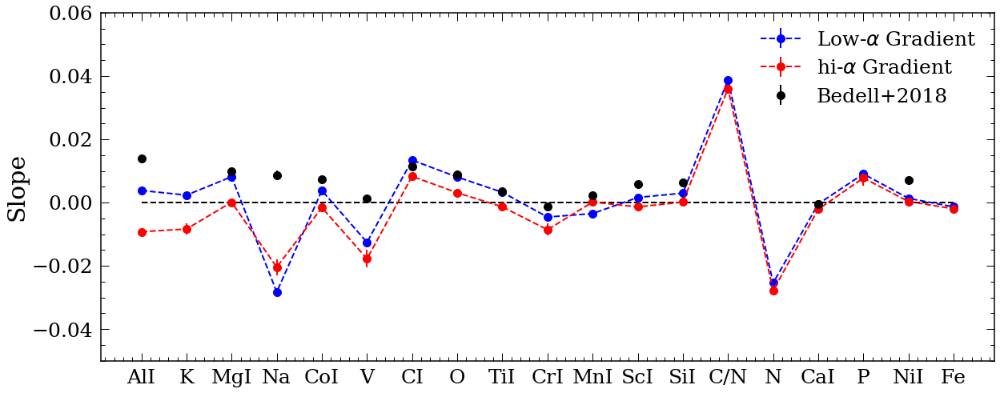

In [147]:
# differnt metalicity
# stars with age < 8 Gyr
plt.figure(figsize=(20,8))
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['la_grad'],yerr=df_disp_plot['la_grad_err'],
             fmt='bo--',label='Low-$\\alpha$ Gradient',markersize=10)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['ha_grad'],yerr=df_disp_plot['ha_grad_err'],
             fmt='ro--',label='hi-$\\alpha$ Gradient',markersize=10)
plt.errorbar(df_disp_plot['Abund'],df_disp_plot['m'],yerr=df_disp_plot['m_err'],
             fmt='ko',label='Bedell+2018',markersize=10)
plt.plot(df_disp_plot['Abund'],np.zeros(len(df_disp_plot['Abund'])),'k--')

plt.ylim([-0.05,0.06])
plt.ylabel('Slope')
plt.legend()
#plt.savefig('slopes.png')

In [141]:
df_disp_plot.to_pickle('intrinsic_notemp_error.pkl')

# Check flags.... 
Most stars on the left side clumps are stars with temp. outside of training set. 

before cutting: 245497


"\n# After cutting\ndf=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]\ndf=df.loc[df['TEFF']<5200]\n\n\nplt.subplot(1,2,2)\nplt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')\nplt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')\nplt.xlim([-1.2,0.8])\nplt.ylim([-0.4,0.5])\nplt.title('After cut',fontsize=25)\nplt.legend()\n\nprint('after cutting:',len(df))\n\n"

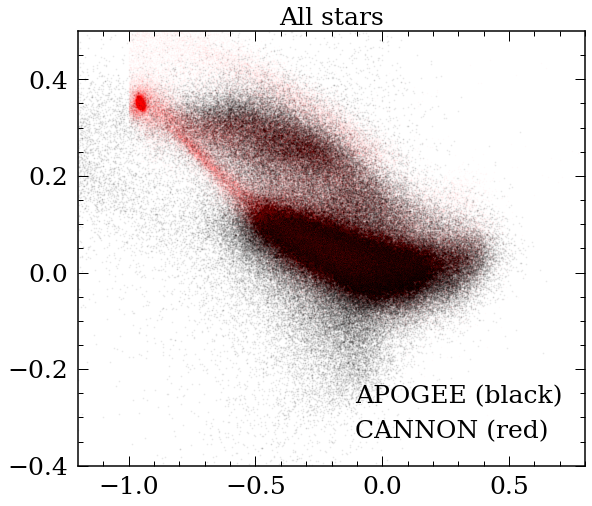

In [55]:
df=pd.read_pickle('CannonDR16.pkl')
print('before cutting:',len(df))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('All stars',fontsize=25)
plt.legend()

"""
# After cutting
df=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])<0.2]
df=df.loc[df['TEFF']<5200]


plt.subplot(1,2,2)
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('After cut',fontsize=25)
plt.legend()

print('after cutting:',len(df))

"""


In [218]:
df_check=df.loc[abs(df['[Mg/Fe]']-df['MG_FE'])>0.2]

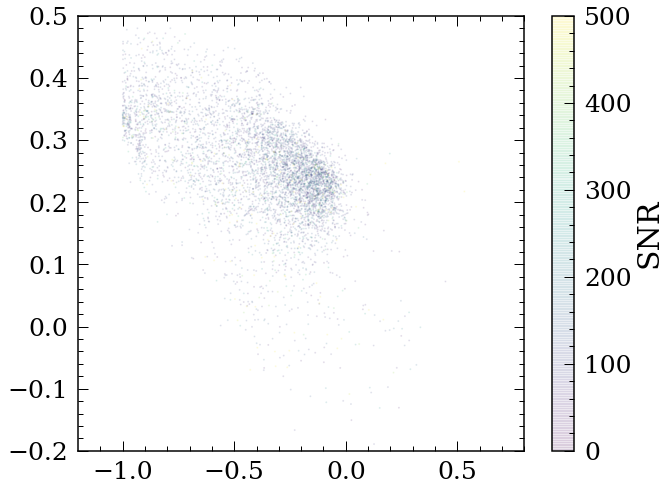

In [219]:
plt.figure(figsize=(10,8))
plt.scatter(df_check['[Fe/H]'],df_check['[Mg/Fe]'],c=df_check['SNR'],s=1,label='APOGEE (black)',vmin=0,vmax=500,alpha=0.1)
plt.xlim([-1.2,0.8])
plt.ylim([-0.2,0.5])
cb=plt.colorbar()
cb.set_label('SNR')

In [222]:
starflag=np.zeros(len(df_check))
starflags=[]
count=0
for i in df_check['STARFLAG'].unique():
    m=df_check['STARFLAG']==i
    starflag[m]=count
    starflags.append(df_check[m]['STARFLAGS'].iloc[0])
    count=count+1
df_check['STARFLAG_color']=starflag


  

In [ ]:
for i in df_check['STARFLAG_color'].unique():
    df_check2=df_check.loc[df_check['STARFLAG_color']==i]
    plt.figure()
    plt.scatter(df_check2['[Fe/H]'],df_check2['[Mg/Fe]'],c='k',s=1,label='APOGEE (black)',alpha=0.1)
    plt.xlim([-1.2,0.8])
    plt.ylim([-0.2,0.5])
    plt.title(str(i))
    

In [229]:
sus=[4,5,8,12,13,15]
starnumb=[]
flags=[]
for i in sus:
    df_check2=df_check.loc[df_check['STARFLAG_color']==i]
    for j in starflags[i].split(','):
        flags.append(j)
    starnumb.append(len(df_check2))
    print(starflags[i],len(df_check2))

 2484
SUSPECT_BROAD_LINES 331
PERSIST_LOW 551
BRIGHT_NEIGHBOR 570
PERSIST_HIGH 309
BRIGHT_NEIGHBOR,PERSIST_LOW 163


In [227]:
import collections
c = collections.Counter()
c.update(flags)

In [228]:
print(c.most_common())

[('PERSIST_LOW', 2), ('BRIGHT_NEIGHBOR', 2), ('', 1), ('SUSPECT_BROAD_LINES', 1), ('PERSIST_HIGH', 1)]
